# Visual Recognition HW1 - Semantic segmentation

## Overview
The goal of this task is to finish the implementation of a semantic segmentation model based on the [BiFPN](https://arxiv.org/abs/1911.09070) approach.
And test the capabilities of the model on [VOC 2011 dataset](http://host.robots.ox.ac.uk/pascal/VOC/voc2011/index.html).

To be more precise the model will input a batch of RGB images of shape `(BATCH, 3, IMAGE_HEIGHT, IMAGE_WIDTH)` and output a segmentation mask `m` of shape `(BATCH, #CLASS, PREDICTION_HEIGHT, PREDICTION_WIDTH)`, where `#CLASS` is the number of classes in the VOC2011 segmentation dataset.  
The mask will be such that
* `m[:, i]` equals 1, whether the element of the image corresponds to the object of the `i`-th class in the VOC 2011 segmentation dataset,

This notebook is divided into several sections:
* Preparation - 0 points (everything is already implemented)
  * Installation and imports of packages
  * code for preparation of the dataset
  * utils for visualization
* Model implementation - 2 points

* Training and evaluation - 3 points
  * metrics - 1 point
  * eval loop - 1 points
  * train loop - 1 point
* Inspection and Ablations - 5 points
  * finding best and worst predictions 2 points,
  * ablations - 3 points,


## General information
Please write the code within
```python
## TODO {

## }
```
blocks.

You can also modify other parts of the code if necessary.

You don't have to strictly adhere to the suggested code structure. You can change the flow and use custom implementations as long as the defined tasks are fulfilled.

## Preparation - 0 points

### Libraries

In [ ]:
# A package for visualizing the architecture of the model
!pip install torchinfo

In [ ]:
import copy
import torch
import torchvision
import matplotlib.pyplot as plt
import numpy as np
import torchinfo
import torch.nn as nn
import torch.nn.functional as F
from operator import itemgetter
from tqdm.notebook import tqdm
from operator import itemgetter
from typing import List, Optional, Tuple

EPS = 1e-4
NUM_CLASSES = 21
LEARNING_RATE = 2e-3

### Dataset

In [ ]:
# We downscale images to
IMAGE_HEIGHT = 128
IMAGE_WIDTH = 128

# We will make predictions in a smaller scale
PREDICTION_HEIGHT = 64
PREDICTION_WIDTH = 64


# We want to match data distribution
# of the backbone that we will introduce later
image_net_mean = [0.485, 0.456, 0.406]
image_net_std = [0.229, 0.224, 0.225]


input_transforms = torchvision.transforms.Compose(
    [
        torchvision.transforms.Resize((IMAGE_HEIGHT, IMAGE_WIDTH)),
        torchvision.transforms.ToTensor(),  # our input is an image
        torchvision.transforms.Normalize(image_net_mean, image_net_std),
    ]
)

#UPDATE: changed target transform , removed the confusing cyclical switch
target_transforms = torchvision.transforms.Compose(
    [
        torchvision.transforms.Resize(
            (PREDICTION_HEIGHT, PREDICTION_WIDTH),
            interpolation=torchvision.transforms.InterpolationMode.NEAREST,
        ),
        torchvision.transforms.PILToTensor(),  # gives uint8
        torchvision.transforms.Lambda(lambda x: (x.squeeze(-3)).type(torch.long)),
    ]
)

In [ ]:
import torchvision

# Directory for dataset storage
DATA_PATH = "~/torch_datasets/voc"

TRAIN_DATASET = torchvision.datasets.VOCSegmentation(
    root=DATA_PATH,
    year="2011",
    image_set="train",
    download=True,
    transform=input_transforms,
    target_transform=target_transforms,
)

TEST_DATASET = torchvision.datasets.VOCSegmentation(
    root=DATA_PATH,
    year="2011",
    image_set="val",
    download=True,
    transform=input_transforms,
    target_transform=target_transforms,
)

100%|██████████| 1.77G/1.77G [01:09<00:00, 25.6MB/s]


In [ ]:
BATCH_SIZE = 32
TRAIN_LOADER = torch.utils.data.DataLoader(
    TRAIN_DATASET, shuffle=True, batch_size=BATCH_SIZE
)
TEST_LOADER = torch.utils.data.DataLoader(
    TEST_DATASET, shuffle=True, batch_size=BATCH_SIZE
)

In [ ]:
samples = next(iter(TRAIN_LOADER))
images, masks = samples

assert len(images.shape) == 4
assert images.shape[0] == BATCH_SIZE
assert images.shape[1] == 3
assert images.shape[2] == IMAGE_HEIGHT
assert images.shape[3] == IMAGE_WIDTH
assert images.dtype == torch.float32

assert len(masks.shape) == 3
assert masks.shape[0] == BATCH_SIZE
assert masks.shape[1] == PREDICTION_HEIGHT
assert masks.shape[2] == PREDICTION_WIDTH
assert masks.dtype == torch.long

### Utils

In [ ]:
def visualize_data(images, masks):
    """
    Args:
        images: tensor of shape (BATCH, 3, H, W)
        masks: tensor of shape (BATCH, H, W)
    """
    assert len(images.shape) == 4
    num_images = images.shape[0]
    assert masks.shape[0] == num_images

    m1, m2, m3 = (
        ((masks == 1) | (masks==2) | (masks == 3) | (masks == 4) | (masks == 5) | (masks == 6)).type(torch.long),
        ((masks == 7) | (masks == 8) | (masks == 9) | (masks == 10) | (masks == 11) | (masks == 12)).type(torch.long),
        ((masks == 13) | (masks == 14) | (masks == 15) | (masks == 16) | (masks == 17) | (masks == 18)).type(torch.long),
    )
    _, axes = plt.subplots(num_images, 4, figsize=(32, 32))

    for i, (img, p, o, b) in enumerate(zip(images, m1, m2, m3)):
        axes[i, 0].axis("off")
        axes[i, 0].imshow(np.clip(img.permute(1, 2, 0).numpy()/4.5 + 0.5, 0, 1))
        axes[i, 1].axis("off")
        axes[i, 1].imshow(p)
        axes[i, 2].axis("off")
        axes[i, 2].imshow(o)
        axes[i, 3].axis("off")
        axes[i, 3].imshow(b)

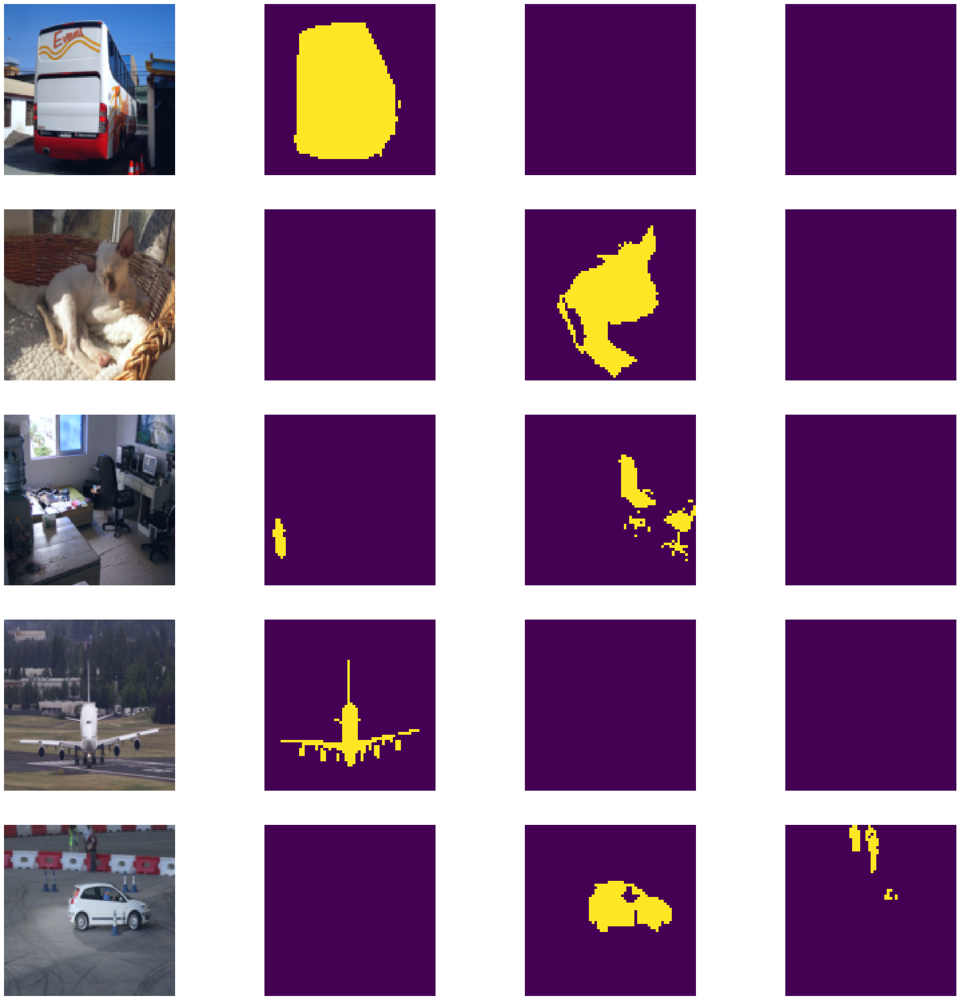

In [ ]:
visualize_data(images[:5], masks[:5])

## Model Implementation - 2 points


### Backbone preparation
Here, you will download the EfficientNet model and create classes that will allow you to extract features from the downloaded model. By features, we mean outputs of specified layers.

### EfficientNet Feature Extraction
First, let's download and inspect the model.

In [ ]:
def get_efficient_net():
    return torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_efficientnet_b0', pretrained=True)

def get_example_input():
    return torch.rand(1, 3, IMAGE_HEIGHT, IMAGE_WIDTH) # [B, C, H, W]

efficient_net = get_efficient_net()
print(torchinfo.summary(efficient_net, input_size=(1, 3, IMAGE_HEIGHT, IMAGE_WIDTH)))
print(efficient_net)

/usr/local/lib/python3.11/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/NVIDIA/DeepLearningExamples/zipball/torchhub" to /root/.cache/torch/hub/torchhub.zip
/root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn

Layer (type:depth-idx)                                       Output Shape              Param #
EfficientNet                                                 [1, 1000]                 --
├─Sequential: 1-1                                            [1, 32, 64, 64]           --
│    └─Conv2d: 2-1                                           [1, 32, 64, 64]           864
│    └─BatchNorm2d: 2-2                                      [1, 32, 64, 64]           64
│    └─SiLU: 2-3                                             [1, 32, 64, 64]           --
├─Sequential: 1-2                                            [1, 320, 4, 4]            --
│    └─Sequential: 2-4                                       [1, 16, 64, 64]           --
│    │    └─MBConvBlock: 3-1                                 [1, 16, 64, 64]           1,448
│    └─Sequential: 2-5                                       [1, 24, 32, 32]           --
│    │    └─MBConvBlock: 3-2                                 [1, 24, 32, 32]           6,00

In [ ]:
# get resnet50
def get_resnet50():
    return torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_resnet50', pretrained=True)

def get_example_input():
    return torch.rand(1, 3, IMAGE_HEIGHT, IMAGE_WIDTH)  # [B, C, H, W]

resnet50 = get_resnet50()
example_input = get_example_input()

print(torchinfo.summary(resnet50, input_size=(1, 3, IMAGE_HEIGHT, IMAGE_WIDTH)))
print(resnet50)

Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub
Downloading: "https://api.ngc.nvidia.com/v2/models/nvidia/resnet50_pyt_amp/versions/20.06.0/files/nvidia_resnet50_200821.pth.tar" to /root/.cache/torch/hub/checkpoints/nvidia_resnet50_200821.pth.tar
100%|██████████| 97.7M/97.7M [00:00<00:00, 136MB/s]


Layer (type:depth-idx)                        Output Shape              Param #
ResNet                                        [1, 1000]                 --
├─Conv2d: 1-1                                 [1, 64, 64, 64]           9,408
├─BatchNorm2d: 1-2                            [1, 64, 64, 64]           128
├─ReLU: 1-3                                   [1, 64, 64, 64]           --
├─MaxPool2d: 1-4                              [1, 64, 32, 32]           --
├─Sequential: 1-5                             [1, 2048, 4, 4]           --
│    └─Sequential: 2-1                        [1, 256, 32, 32]          --
│    │    └─Bottleneck: 3-1                   [1, 256, 32, 32]          75,008
│    │    └─Bottleneck: 3-2                   [1, 256, 32, 32]          70,400
│    │    └─Bottleneck: 3-3                   [1, 256, 32, 32]          70,400
│    └─Sequential: 2-2                        [1, 512, 16, 16]          --
│    │    └─Bottleneck: 3-4                   [1, 512, 16, 16]          379,392

Fill in the code below according to the docstrings.  
There are several approaches to the task below one of them is to use `register_forward_hook`.  
The other one is to replace selected modules with appropriate wrappers.

In [ ]:
class EffNetFeatureExtractor(torch.nn.Module):
    """
    Accepts an efficient_net and an list of layers for feature extraction (feature_layer_ids).
    When called returns a list containing the outputs of the selected layers.
    The parameter feature_layer_ids specifies the ids of the layers from
    efficient_net.layers.
    To be more precise for feature_layer_ids = [4, 6] it returns a list containing outputs of
    self.efficient_net.layers[4] and self.efficient_net.layers[6].
    """

    def __init__(
        self, efficient_net, feature_layer_ids: List[int]
    ) -> None:
        super().__init__()

        self.efficient_net = efficient_net
        self.feature_layer_ids = feature_layer_ids

        ## TODO {
        self.feature_maps = {}
        self.hooks = []

        for layer_id in feature_layer_ids:
            hook = self._create_hook(layer_id)
            self.hooks.append(
                self.efficient_net.layers[layer_id].register_forward_hook(hook)
            )

    def _create_hook(self, layer_id: int):
        def hook(module, input, output):
            self.feature_maps[layer_id] = output

        return hook
        ## }

    def forward(self, x: torch.Tensor) -> List[torch.Tensor]:

        ## TODO {
        self.feature_maps.clear()
        self.efficient_net(x)
        extracted_features = [self.feature_maps[id] for id in self.feature_layer_ids]
        ## }
        return extracted_features


def get_extracted_feature_shapes(net: EffNetFeatureExtractor):
    extracted_features = net(get_example_input())
    extracted_feature_shapes = [ef.shape for ef in extracted_features]
    return extracted_feature_shapes


##### TESTS START #####


def test_feature_extraction():
    efficient_net = get_efficient_net()
    net = EffNetFeatureExtractor(
        efficient_net=efficient_net, feature_layer_ids=[i for i in range(0, 7, 2)]
    )
    extracted_feature_shapes = get_extracted_feature_shapes(net)
    extracted_feature_shapes = get_extracted_feature_shapes(net) # this is on purpose

    expected_feature_shapes = [
        (1, 16, 64, 64),
        (1, 40, 16, 16),
        (1, 112, 8, 8),
        (1, 320, 4, 4),
    ]
    assert len(extracted_feature_shapes) == len(expected_feature_shapes)
    for extracted_fs, expected_fs in zip(
        extracted_feature_shapes, expected_feature_shapes
    ):
        assert extracted_fs == expected_fs


test_feature_extraction()

#####  TESTS END  #####

Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


### Feature extractor for the Resnet50 backbone

Implement analogous feature extractor as above , but for the ResNet50 backbone.

In [ ]:
class ResNet50FeatureExtractor(torch.nn.Module):
## TODO {
    def __init__(self, feature_layer_ids: List[int]):
        super().__init__()
        self.feature_layer_ids = feature_layer_ids
        self.resnet50 = get_resnet50()
        self.feature_maps = {}
        self.hooks = []

        for layer_id in feature_layer_ids:
            hook = self._create_hook(layer_id)
            self.hooks.append(
                self.resnet50.layers[layer_id].register_forward_hook(hook)
            )

    def _create_hook(self, layer_id: int):
        def hook(module, input, output):
            self.feature_maps[layer_id] = output

        return hook

    def forward(self, x: torch.Tensor) -> List[torch.Tensor]:
        self.feature_maps.clear()
        self.resnet50(x)
        return [self.feature_maps[id] for id in self.feature_layer_ids]
## }

### Feature Channel Matching
In BiFPN we want all features to have the same number of channels (so we can add them easily).  
  
`MatchChannels` is already implemented.

Of course , you can use your own implementation of the backbone and MatchChannels.

In [ ]:
class MatchChannels(torch.nn.Module):
    """
    Given the input of shape (BATCH, in_channels, H, W),
    converts it to the one of shape (BATCH, out_channels, H, W)
    """

    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()
        self.conv = torch.nn.Conv2d(
            in_channels=in_channels, out_channels=out_channels, kernel_size=1, stride=1
        )
        self.bn = torch.nn.BatchNorm2d(out_channels)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        assert len(x.shape) == 4
        x = self.conv(x)
        x = self.bn(x)
        return x


class EffNetBackboneWrapper(torch.nn.Module):
    """
    Given a efficient net backbone and channel_matching_fn (a function of form lambda x: MatchChannels(x, c))
    runs backbone to extract the features and uses modules created using channel_matching_fn to
    make channel dimension equal in all features.

    UPDATE: freezing gradients is NOT recommended.
    """

    def __init__(self, backbone: EffNetFeatureExtractor, channel_matching_fn):
        super().__init__()
        self.backbone = backbone

        ## TODO {
        self.channel_matching_fn = channel_matching_fn
        features = backbone(get_example_input())
        self.match_channels_list = nn.ModuleList([channel_matching_fn(ef.shape[1]) for ef in features])
        ## }

    def forward(self, x: torch.Tensor) -> List[torch.Tensor]:

        ## TODO {
        features = self.backbone(x)
        channel_matched_features = []

        for feature, match_channels in zip(features, self.match_channels_list):
            channel_matched_features.append(match_channels(feature))
        ## }

        return channel_matched_features

##the same backbone wrapper for the other Resnet50 backbone
class Resnet50BackboneWrapper(torch.nn.Module):
## TODO {
    def __init__(
            self,
            backbone: torch.nn.Module,
            channel_matching_fn: torch.nn.Module,
    ):
        super().__init__()
        self.backbone = backbone
        self.channel_matching_fn = channel_matching_fn
        features = backbone(get_example_input())
        self.match_channels_modules = nn.ModuleList([channel_matching_fn(ef.shape[1]) for ef in features])

    def forward(self, x: torch.Tensor) -> List[torch.Tensor]:
        features = self.backbone(x)
        channel_matched_features = [
            self.match_channels_modules[i](feature)
            for i, feature in enumerate(features)
        ]

        return channel_matched_features

## }

##### TESTS START #####


def test_backbone_basic():
    efficient_net = get_efficient_net()
    net = EffNetFeatureExtractor(
        efficient_net=efficient_net, feature_layer_ids=[i for i in range(0, 7, 2)]
    )

    wrapped = EffNetBackboneWrapper(
        backbone=net, channel_matching_fn=lambda x: MatchChannels(x, 24)
    )

    out = wrapped(get_example_input())

    out_shapes = [feature.shape for feature in out]

    expected_feature_shapes = [
        (1, 24, 64, 64),
        (1, 24, 16, 16),
        (1, 24, 8, 8),
        (1, 24, 4, 4),
    ]
    assert len(out_shapes) == len(expected_feature_shapes)
    for extracted_fs, expected_fs in zip(out_shapes, expected_feature_shapes):
        assert extracted_fs == expected_fs


#

### BiFPN - Feature Fusion
Now we will implement the BiFPN network. Starting with single-way feature fusion, and then stacked multiple.   
Complete the code below according to docstrings.

In [ ]:
class BiFPNSingle(torch.nn.Module):
    """
    Given list of height features (list of length height),
    with each feature having feature_channels channels
    (that is i'th feature has shape (BATCH, feature_channels, H_i, W_i))
    performs the following sequence of operations
    res[0] = feature_list[0]
    res[i] = ACT(BN(CONVS(w[i][1] * feature_list[i] + w[i][2]*RESIZE(res[i-1]) + w[i][3]*aux_feature_list[i])))
    where the part w[i][3]*aux_feature_list[i] is present only when aux_feature_list is not None
    and weights w are calculated like in the BiFPN paper.
    Choice of CONVS is not specified."""

    def __init__(self, feature_channels: int, height: int) -> None:
        super().__init__()
        self.height = height
        self.weights = torch.nn.ParameterList([
            torch.nn.Parameter(torch.ones(3, dtype=torch.float32))
            for _ in range(height - 1)
        ])
        self.convs = torch.nn.ModuleList([
            torch.nn.Sequential(
                torch.nn.Conv2d(feature_channels, feature_channels, kernel_size=3, padding=1),
                torch.nn.BatchNorm2d(feature_channels),
                torch.nn.ReLU()
            )
            for _ in range(height - 1)
        ])

    def normalize_weights(self, weights: torch.Tensor):
        """
        Makes weights "add up to one", uses either softmax or the
        method from the BiFPN paper.
        """
        weights = weights + 1e-4  # Add a small epsilon to avoid division by zero
        weights = weights / torch.sum(weights)
        return weights

    def forward(
        self,
        feature_list: List[torch.Tensor],
        aux_feature_list: Optional[List[torch.Tensor]] = None,
    ) -> List[torch.Tensor]:
        ## TODO {
        result: List[torch.Tensor] = [feature_list[0]]

        for i in range(1, self.height):
            w = self.normalize_weights(self.weights[i - 1]) # normalize weights
            resized = F.interpolate(
                result[i - 1],
                size=feature_list[i].shape[-2:],
                mode='bilinear'
            )
            fused = w[0] * feature_list[i] + w[1] * resized
            # When aux_feature_list is not None
            if aux_feature_list is not None:
                fused = fused + w[2] * aux_feature_list[i]

            result.append(self.convs[i - 1](fused))
        ## }

        return result




##### TESTS START #####


def test_bifpn_single():

    bifpn_single = BiFPNSingle(32, 3)

    input_data = [
        torch.randn(1, 32, 64, 64),
        torch.randn(1, 32, 32, 32),
        torch.randn(1, 32, 7, 7),
    ]

    out = bifpn_single(input_data)

    assert len(out) == len(input_data)
    for o, i in zip(out, input_data):
        print(o.shape == i.shape)
        assert o.shape == i.shape


test_bifpn_single()
#####  TESTS END  #####

True
True
True


In [ ]:
class BiFPN(torch.nn.Module):
    """
    Uses two BiFPNSingle modules to implement a BiFPN module as in the BiFPN paper.
    """
    def __init__(self, feature_channels: int, height: int) -> None:
    ## TODO {
        super().__init__()
        self.top_down = BiFPNSingle(feature_channels, height)
        self.bottom_up = BiFPNSingle(feature_channels, height)

    def forward(
        self,
        feature_list: List[torch.Tensor],
        aux_feature_list: Optional[List[torch.Tensor]] = None,
    ) -> List[torch.Tensor]:
        features = list(reversed(feature_list))
        aux_features = None if aux_feature_list is None else list(reversed(aux_feature_list))
        top_down_out = self.top_down(features, aux_features)
        top_down_out = list(reversed(top_down_out))

        # Second pass
        result = self.bottom_up(top_down_out, aux_feature_list)
        return result
    ## }


##### TESTS START #####


def test_bifpn():

    bifpn = BiFPN(32, 3)

    input_data = [
        torch.randn(1, 32, 64, 64),
        torch.randn(1, 32, 32, 32),
        torch.randn(1, 32, 7, 7),
    ]

    out = bifpn(input_data)

    assert len(out) == len(input_data)
    for o, i in zip(out, input_data):
        assert o.shape == i.shape


test_bifpn()
#####  TESTS END  #####

In [ ]:
class StackedBiFPN(torch.nn.Module):
    """
    Stacks multiple BiFPN modules for deep feature fusion in segmentation tasks.
    when num_repeats == 1 it is equivalent to BiFPN above (just single module),
    for num_repeats > 1 implements num_repeats  linearly stacked BiFPN modules
    """
    def __init__(self, num_repeats: int, feature_channels: int, height: int) -> None:
    ## TODO {
        super().__init__()
        self.layers = nn.ModuleList([
            BiFPN(feature_channels, height)
            for _ in range(num_repeats)
        ])


    def forward(
        self,
        feature_list: List[torch.Tensor],
        aux_feature_list: Optional[List[torch.Tensor]] = None,
    ) -> List[torch.Tensor]:
        x = feature_list
        for layer in self.layers:
            x = layer(x, aux_feature_list)

        return x
    ## }


### Segmentation Head

In [ ]:
class SegmentationHead(torch.nn.Module):
    """
    Given an input of shape (B, feature_channels, H, W)
    Produces the output of shape (B, num_classes, H', W') (where H', W' = output_shape)
    consisting of logits (that is no activation in the last layer) that can be used to classify each pixel.
    To do so uses additional convolution(s) that operate on input with inner_channels channels.
    """

    def __init__(
        self,
        feature_channels: int,
        output_shape: Tuple[int, int] = (PREDICTION_HEIGHT, PREDICTION_WIDTH),
        inner_channels: int = 256,
        num_classes: int = 21,
    ):
        super().__init__()
        self.output_shape = output_shape
        self.num_classes = num_classes
        ## TODO {
        self.block = nn.Sequential(
            nn.Conv2d(feature_channels, inner_channels, 3, padding=1, bias=False),
            nn.BatchNorm2d(inner_channels),
            nn.SiLU(inplace=True),
            nn.Conv2d(inner_channels, inner_channels, 3, padding=1, bias=False),
            nn.BatchNorm2d(inner_channels),
        )

        # Skip connection
        self.shortcut = nn.Conv2d(feature_channels, inner_channels, 1, bias=False) if feature_channels != inner_channels else nn.Identity()

        # Final layer
        self.final = nn.Sequential(
            nn.SiLU(inplace=True),
            nn.Dropout2d(p=0.2),
            nn.Conv2d(inner_channels, num_classes, 1)
        )
        ## }

    def forward(self, x):
        ## TODO {
        x = self.block(x) + self.shortcut(x)
        x = F.interpolate(x,
                        size=self.output_shape,
                        mode='bilinear',
                        align_corners=True)

        return self.final(x)
        ## }

        assert result.shape[0] == x.shape[0]
        assert result.shape[1] == self.num_classes
        assert result.shape[2:] == self.output_shape
        return result

### Network

In [ ]:
class Net(torch.nn.Module):
    """
    input parameters (defaults provided):
    * num_repeats - nr# of BiFPNSingle modules,
    * backbone - either 'efficientnet' or 'resnet50'

    Given an input of shape (BATCH, 3, H, W)
    returns a tensor of shape (BATCH, #CLASS, H', W') (where H', W' = output_shape)
    """

    def __init__(
        self,
        num_repeats = 1,
        backbone = 'efficientnet',
        feature_channels: int = 256,
        output_shape: Tuple[int, int] = (PREDICTION_HEIGHT, PREDICTION_WIDTH),
        feature_layer_ids: List[int] = [0, 1, 2, 3, 4, 5, 6], # will update some reccomended channels here
    ) -> None:
        super().__init__()

        ## TODO {
        if backbone == 'efficientnet':
            efficient_net = get_efficient_net()
            extractor = EffNetFeatureExtractor(efficient_net, feature_layer_ids)
            self.feature_extractor = EffNetBackboneWrapper(extractor,
                  lambda x: MatchChannels(x, feature_channels))
        elif backbone == 'resnet50':
            extractor = ResNet50FeatureExtractor(feature_layer_ids)
            self.feature_extractor = Resnet50BackboneWrapper(extractor,
                  lambda x: MatchChannels(x, feature_channels))
        else:
            raise ValueError(f'Unknown backbone {backbone}')

        num_levels = len(feature_layer_ids)
        self.bifpn = torch.nn.Sequential(
            StackedBiFPN(num_repeats, feature_channels, num_levels),
        )
        self.merge_bn = nn.BatchNorm2d(feature_channels)
        self.segmentation_head = SegmentationHead(feature_channels,
                                                  output_shape,
                                                  num_classes=NUM_CLASSES)
        ## }

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        ## TODO {
        x = self.feature_extractor(x)
        x = self.merge_bn(torch.stack([F.interpolate(i,
                             size=x[0].shape[-2:],
                             mode='bilinear',
                             align_corners=True)
                for i in x], dim=0).mean(dim=0))

        result = self.segmentation_head(x)
        ## }
        return result

## Training and Evaluation - 3 points

### Metrics - 1 point

Implement however you wish the four  metrics: accuracy  , mIoU (IoU for all classes at once), Frequency Weighted IoU.

In [ ]:
def accuracy(prediction: np.ndarray, ground_truth: np.ndarray) -> np.ndarray:
    ## TODO {
    """
    Compute accuracy for each class in dict.
    """
    acc: dict = {}
    for cls in range(NUM_CLASSES):
        gt_mask = (ground_truth == cls)
        if not gt_mask.any():
            continue
        correct = (prediction == cls) & gt_mask
        incorrect = (prediction != cls) & (~gt_mask)
        acc[cls] = np.mean(correct | incorrect)
    return acc
    ## }
def miou_metric(prediction: np.ndarray, ground_truth: np.ndarray):
    ## TODO {
    """
    Compute mean Intersection‑over‑Union (mIoU) over all class:
    IoU[c] = (pred==c & gt==c) / (|pred==c U gt==c| + EPS)
    Return mean after NUM_CLASSES.
    """
    ious = []
    for cls in range(NUM_CLASSES):
        pred_mask = (prediction == cls)
        gt_mask   = (ground_truth == cls)
        inter = np.logical_and(pred_mask, gt_mask).sum()
        union = np.logical_or(pred_mask, gt_mask).sum()
        ious.append(inter / (union + EPS))
    return float(np.mean(ious))
    ## }
def frequency_weighted_iou(prediction: np.ndarray, ground_truth: np.ndarray):
    """
    Computation of Frequency Weighted IoU:
    FWIoU = sum_c (freq[c] * IoU[c]), gdzie freq[c] = |gt==c| / total_pixels
    EPS adding in case of dividing by 0.
    """
    total_pixels = ground_truth.size
    fw_iou = 0.0
    for cls in range(NUM_CLASSES):
        gt_mask = (ground_truth == cls)
        pred_mask = (prediction   == cls)
        freq = gt_mask.sum() / (total_pixels + EPS)
        inter = np.logical_and(pred_mask, gt_mask).sum()
        union = np.logical_or(pred_mask, gt_mask).sum()
        iou_c = inter / (union + EPS)
        fw_iou += freq * iou_c
    return float(fw_iou)
    ## }

### Eval Loop - 1point

In [ ]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#UPDATE: removed one_hot_prediction (it is unnecessary)

@torch.no_grad
def eval_fn(model, test_loader):
    model.eval()

    total = 0
    for data in test_loader:
        x, y = data
        x, y = x.to(DEVICE), y.to(DEVICE)
        logits = model(x)
        prediction = torch.argmax(logits.detach(), dim=-3, keepdim=False)

        #collect accuracy  , mIoU, Frequency Weighted IoU
        ## TODO {
        prediction = prediction.cpu().numpy()
        y = y.cpu().numpy()
        acc = accuracy(prediction, y)
        miou = miou_metric(prediction, y)
        fw_iou = frequency_weighted_iou(prediction, y)
        ## }

#collect accuracy  , mIoU, Frequency Weighted IoU
#print metrics for all classes
## TODO {
    print(f"Mean Accuracy: {np.mean(np.array(list((acc.values())), dtype='float64')):.4f}")
    print(f"Mean IoU:      {miou:.4f}")
    print(f"FW IoU:        {fw_iou:.4f}")

    return miou
## }

### Train Loop - 1 point

Complete the two training loops using the Net constructor with default values.
Use `CrossEntropyLoss` and the Dice loss .


In [ ]:
def train_crossentropy(
    model,
    optimizer,
    train_loader,
    test_loader,
    num_epoch,
    eval_fn,
    #UPDATE: remove weights (unnecessary)
):
    ## TODO {
    """
    Training loop with Cross-Entropy loss, tracks and plots train/val loss,
    and prints best model's validation mIoU.
    """
    ce_loss = nn.CrossEntropyLoss(ignore_index=255)

    train_losses = []
    val_losses = []
    best_miou = 0.0
    best_epoch = 0
    best_model_wts = copy.deepcopy(model.state_dict())

    for epoch in range(1, num_epoch + 1):
        # Training loop
        model.train()
        running_loss = 0.0
        for x, y in tqdm(train_loader, desc=f"[CE] Epoch {epoch}/{num_epoch}", leave=False):
            x, y = x.to(DEVICE), y.to(DEVICE)
            optimizer.zero_grad()
            logits = model(x)
            loss = ce_loss(logits, y)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        avg_train_loss = running_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        val_miou = eval_fn(model, test_loader)
        print(f"[CE] Epoch {epoch}/{num_epoch} — Train Loss: {avg_train_loss:.4f}")

        # Choose best model
        if val_miou > best_miou:
            best_miou = val_miou
            best_epoch = epoch
            best_model_wts = copy.deepcopy(model.state_dict())

    model.load_state_dict(best_model_wts)
    print(f"Best Val mIoU: {best_miou:.4f} at epoch {best_epoch}")

    return best_miou
    ## }

def train_dice(
    model,
    optimizer,
    train_loader,
    test_loader,
    num_epoch,
    eval_fn,
    #UPDATE: remove weights (unnecessary)
):
    ## TODO {
    num_classes = model.segmentation_head.num_classes

    train_losses = []
    val_losses = []
    best_miou = 0.0
    best_epoch = 0
    best_model_wts = copy.deepcopy(model.state_dict())

    for epoch in range(1, num_epoch + 1):
        # Training loop
        model.train()
        running_loss = 0.0
        for x, y in tqdm(train_loader, desc=f"[Dice] Epoch {epoch}/{num_epoch}", leave=False):
            x, y = x.to(DEVICE), y.to(DEVICE)

            logits = model(x)
            probs = F.softmax(logits, dim=1)

            mask = (y != 255).unsqueeze(1)
            y_clamped = y.clamp(min=0, max=num_classes-1)
            y_onehot = F.one_hot(y_clamped, num_classes).permute(0,3,1,2).float().to(DEVICE)
            probs = probs * mask
            y_onehot = y_onehot * mask

            # Dice loss
            dims = (0, 2, 3)
            intersection = torch.sum(probs * y_onehot, dim=dims)
            union = torch.sum(probs + y_onehot,     dim=dims)
            dice_score = (2.0 * intersection + EPS) / (union + EPS)
            dice_loss = 1.0 - dice_score.mean()

            optimizer.zero_grad()
            dice_loss.backward()
            optimizer.step()
            running_loss += dice_loss.item()

        avg_train_loss = running_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        val_miou = eval_fn(model, test_loader)
        print(f"[Dice] Epoch {epoch}/{num_epoch} — Train Loss: {avg_train_loss:.4f}")

        # Choose best model
        if val_miou > best_miou:
            best_miou = val_miou
            best_epoch = epoch
            best_model_wts = copy.deepcopy(model.state_dict())

    model.load_state_dict(best_model_wts)
    print(f"Best Val mIoU: {best_miou:.4f} at epoch {best_epoch}")

    return best_miou
    ## }

In [ ]:
def create_model_and_optimizer(num_repeats, backbone, feature_layer_ids, lr=LEARNING_RATE):
    model = Net(num_repeats=num_repeats, backbone=backbone, feature_layer_ids=feature_layer_ids)
    model.to(DEVICE)
    optimizer = torch.optim.Adam(params=model.parameters(), lr=lr)
    return model, optimizer


#use at least num_repeats = 3
torch.manual_seed(42)
model, optimizer = create_model_and_optimizer(3, "efficientnet", [1, 3, 5])
train_crossentropy(model, optimizer, TRAIN_LOADER, TEST_LOADER, 20, eval_fn)

Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


[CE] Epoch 1/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9696
Mean IoU:      0.1483
FW IoU:        0.6238
[CE] Epoch 1/20 — Train Loss: 1.0574


[CE] Epoch 2/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9739
Mean IoU:      0.1319
FW IoU:        0.5709
[CE] Epoch 2/20 — Train Loss: 0.5186


[CE] Epoch 3/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9760
Mean IoU:      0.2280
FW IoU:        0.6165
[CE] Epoch 3/20 — Train Loss: 0.3839


[CE] Epoch 4/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9818
Mean IoU:      0.2194
FW IoU:        0.6683
[CE] Epoch 4/20 — Train Loss: 0.3178


[CE] Epoch 5/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9819
Mean IoU:      0.2756
FW IoU:        0.7142
[CE] Epoch 5/20 — Train Loss: 0.2610


[CE] Epoch 6/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9784
Mean IoU:      0.2171
FW IoU:        0.6553
[CE] Epoch 6/20 — Train Loss: 0.2222


[CE] Epoch 7/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9659
Mean IoU:      0.1214
FW IoU:        0.5481
[CE] Epoch 7/20 — Train Loss: 0.1939


[CE] Epoch 8/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9753
Mean IoU:      0.3242
FW IoU:        0.6062
[CE] Epoch 8/20 — Train Loss: 0.1646


[CE] Epoch 9/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9847
Mean IoU:      0.3409
FW IoU:        0.7534
[CE] Epoch 9/20 — Train Loss: 0.1439


[CE] Epoch 10/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9808
Mean IoU:      0.2990
FW IoU:        0.7068
[CE] Epoch 10/20 — Train Loss: 0.1326


[CE] Epoch 11/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9859
Mean IoU:      0.2944
FW IoU:        0.7629
[CE] Epoch 11/20 — Train Loss: 0.1219


[CE] Epoch 12/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9750
Mean IoU:      0.2600
FW IoU:        0.6278
[CE] Epoch 12/20 — Train Loss: 0.1100


[CE] Epoch 13/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9815
Mean IoU:      0.3184
FW IoU:        0.6903
[CE] Epoch 13/20 — Train Loss: 0.1012


[CE] Epoch 14/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9879
Mean IoU:      0.3190
FW IoU:        0.7633
[CE] Epoch 14/20 — Train Loss: 0.0901


[CE] Epoch 15/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9773
Mean IoU:      0.2845
FW IoU:        0.6702
[CE] Epoch 15/20 — Train Loss: 0.0866


[CE] Epoch 16/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9821
Mean IoU:      0.3272
FW IoU:        0.7102
[CE] Epoch 16/20 — Train Loss: 0.0810


[CE] Epoch 17/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9784
Mean IoU:      0.2729
FW IoU:        0.6906
[CE] Epoch 17/20 — Train Loss: 0.0792


[CE] Epoch 18/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9874
Mean IoU:      0.4503
FW IoU:        0.7597
[CE] Epoch 18/20 — Train Loss: 0.0743


[CE] Epoch 19/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9888
Mean IoU:      0.3995
FW IoU:        0.7847
[CE] Epoch 19/20 — Train Loss: 0.0713


[CE] Epoch 20/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9845
Mean IoU:      0.3240
FW IoU:        0.7325
[CE] Epoch 20/20 — Train Loss: 0.0702
Best Val mIoU: 0.4503 at epoch 18


0.4502711967981336

In [ ]:
model, optimizer = create_model_and_optimizer(3, "resnet50", [1, 2, 3])
train_dice(model, optimizer, TRAIN_LOADER, TEST_LOADER, 20, eval_fn)

Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


[Dice] Epoch 1/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9417
Mean IoU:      0.0391
FW IoU:        0.5020
[Dice] Epoch 1/20 — Train Loss: 0.8927


[Dice] Epoch 2/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9529
Mean IoU:      0.0672
FW IoU:        0.4349
[Dice] Epoch 2/20 — Train Loss: 0.8567


[Dice] Epoch 3/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9506
Mean IoU:      0.0643
FW IoU:        0.3744
[Dice] Epoch 3/20 — Train Loss: 0.8329


[Dice] Epoch 4/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9551
Mean IoU:      0.0584
FW IoU:        0.4764
[Dice] Epoch 4/20 — Train Loss: 0.8155


[Dice] Epoch 5/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9485
Mean IoU:      0.0754
FW IoU:        0.4260
[Dice] Epoch 5/20 — Train Loss: 0.7970


[Dice] Epoch 6/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9579
Mean IoU:      0.0926
FW IoU:        0.5228
[Dice] Epoch 6/20 — Train Loss: 0.7874


[Dice] Epoch 7/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9514
Mean IoU:      0.0673
FW IoU:        0.4999
[Dice] Epoch 7/20 — Train Loss: 0.7590


[Dice] Epoch 8/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9692
Mean IoU:      0.0771
FW IoU:        0.6339
[Dice] Epoch 8/20 — Train Loss: 0.7775


[Dice] Epoch 9/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9610
Mean IoU:      0.1581
FW IoU:        0.5464
[Dice] Epoch 9/20 — Train Loss: 0.7273


[Dice] Epoch 10/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9567
Mean IoU:      0.0806
FW IoU:        0.5307
[Dice] Epoch 10/20 — Train Loss: 0.7005


[Dice] Epoch 11/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9467
Mean IoU:      0.1011
FW IoU:        0.4681
[Dice] Epoch 11/20 — Train Loss: 0.7049


[Dice] Epoch 12/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9498
Mean IoU:      0.0900
FW IoU:        0.5057
[Dice] Epoch 12/20 — Train Loss: 0.6957


[Dice] Epoch 13/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9578
Mean IoU:      0.0705
FW IoU:        0.4882
[Dice] Epoch 13/20 — Train Loss: 0.6682


[Dice] Epoch 14/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9710
Mean IoU:      0.1092
FW IoU:        0.6428
[Dice] Epoch 14/20 — Train Loss: 0.6713


[Dice] Epoch 15/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9562
Mean IoU:      0.0968
FW IoU:        0.4756
[Dice] Epoch 15/20 — Train Loss: 0.6527


[Dice] Epoch 16/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9604
Mean IoU:      0.0840
FW IoU:        0.5185
[Dice] Epoch 16/20 — Train Loss: 0.6583


[Dice] Epoch 17/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9676
Mean IoU:      0.1555
FW IoU:        0.5744
[Dice] Epoch 17/20 — Train Loss: 0.6225


[Dice] Epoch 18/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9629
Mean IoU:      0.0899
FW IoU:        0.5148
[Dice] Epoch 18/20 — Train Loss: 0.6043


[Dice] Epoch 19/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9705
Mean IoU:      0.1745
FW IoU:        0.5912
[Dice] Epoch 19/20 — Train Loss: 0.5980


[Dice] Epoch 20/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9696
Mean IoU:      0.1184
FW IoU:        0.6286
[Dice] Epoch 20/20 — Train Loss: 0.5962
Best Val mIoU: 0.1745 at epoch 19


0.17450317577843907

## Some target reference numbers after ~20 epochs :

### (3 BiFPN repeats, used EfficientNet_b0 three feature layers having channels (40, 112, 320), not freezed)
### Test: Pixel Acc: 0.83 | Mean IoU: ~0.3
### Train: Batch Average CELoss: ~0.22 , Average Pixel Acc: 0.9174 | Batch Average Mean IoU: 0.5422
### disclaimer: obtained using a rudimentary solution, can be improved

## Inspection and Ablations - 5 points


First let's inspect the masks generated by the model.


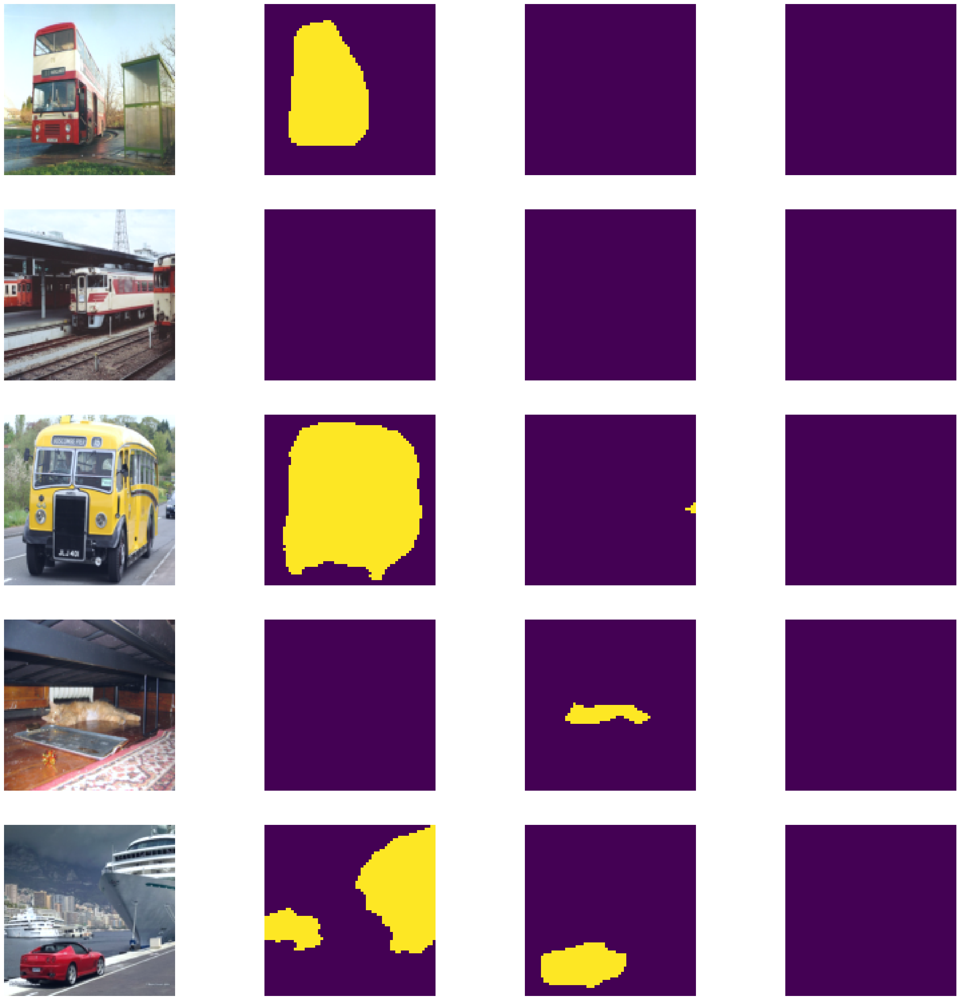

In [ ]:
samples = next(iter(TRAIN_LOADER))
images, masks = samples

with torch.no_grad():
    pred = model(images.to(DEVICE))
    pred = torch.argmax(pred, dim=-3).cpu()


visualize_data(images[:5], pred[:5])

### Best and Worst Predictions - 2 point
Visualize the best and worst prediction made by the model on the test set (according to the accuracy metric) per each class in the dataset.
Compare them with ground truths. Do you notice any problems? If you notice problems then how can they be addressed?


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 1: Aeroplane
Best accuracy:  0.9846
Worst accuracy: 0.7063


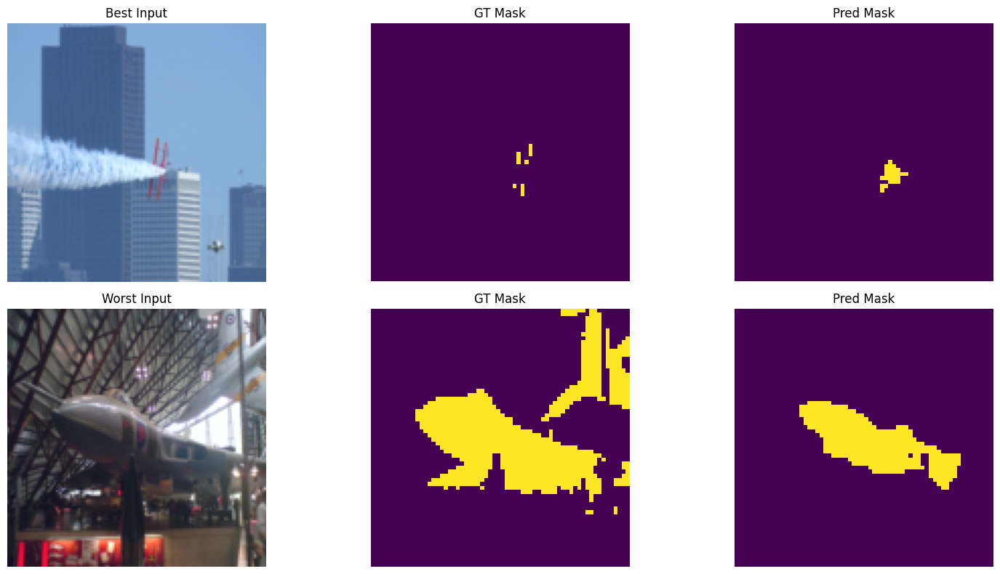


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 2: Bicycle
Best accuracy:  0.9971
Worst accuracy: 0.3804


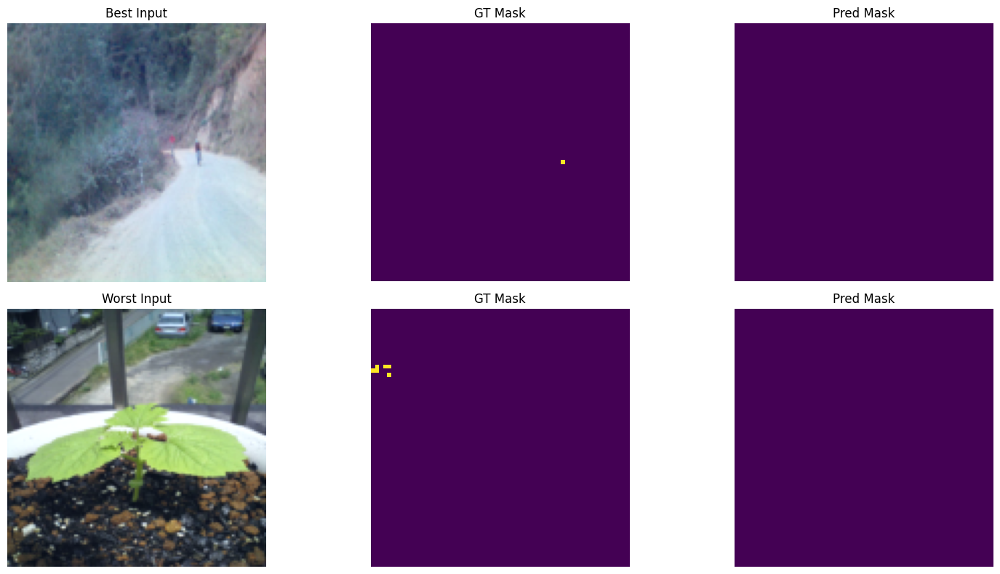


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 3: Bird
Best accuracy:  0.9934
Worst accuracy: 0.5137


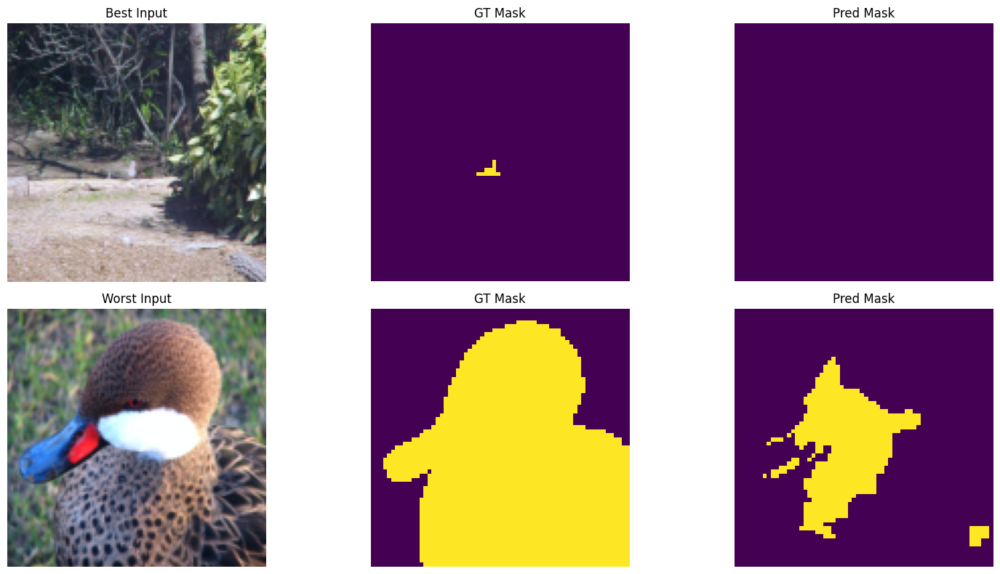


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 4: Boat
Best accuracy:  0.9922
Worst accuracy: 0.5430


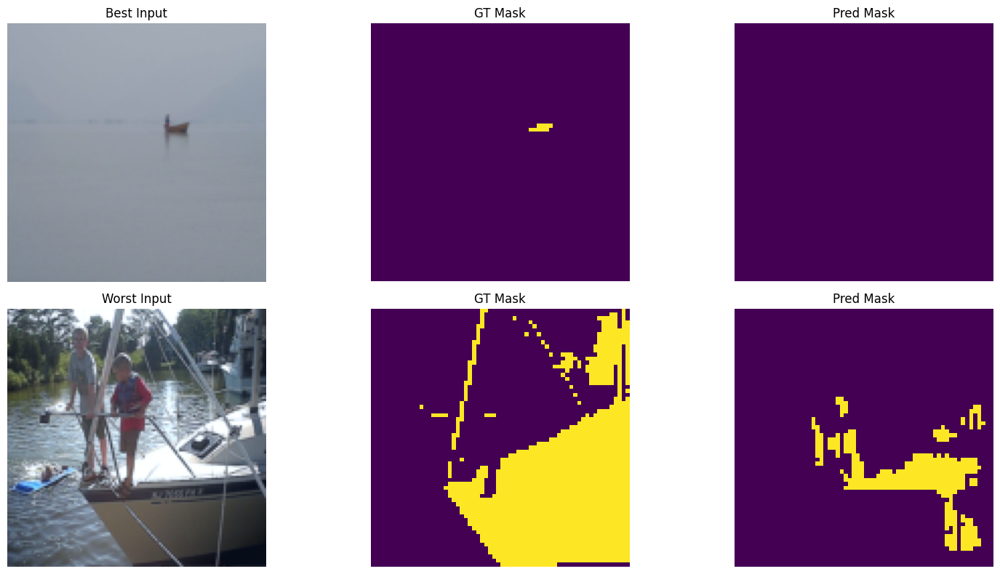


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 5: Bottle
Best accuracy:  0.9761
Worst accuracy: 0.2710


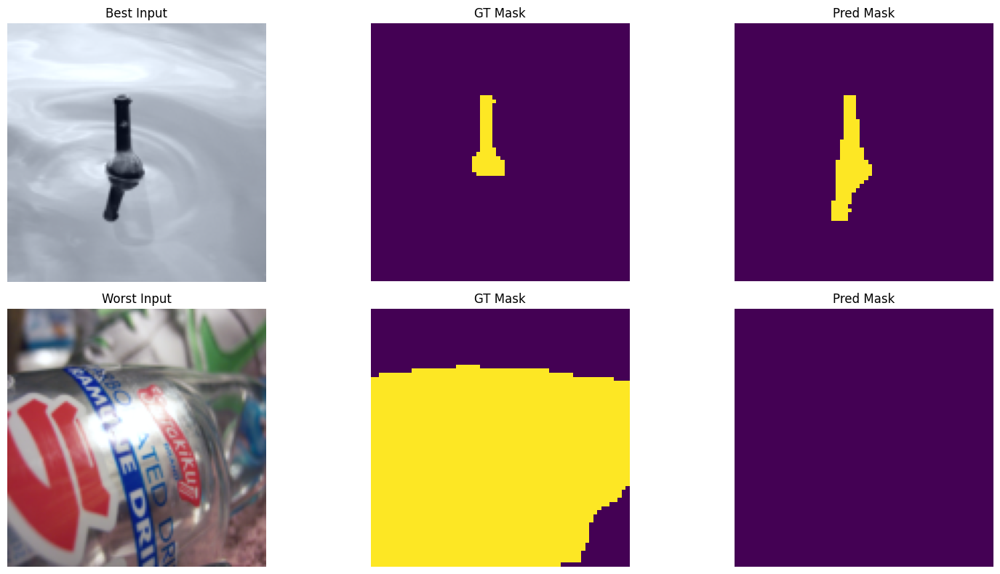


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 6: Bus
Best accuracy:  0.9661
Worst accuracy: 0.1218


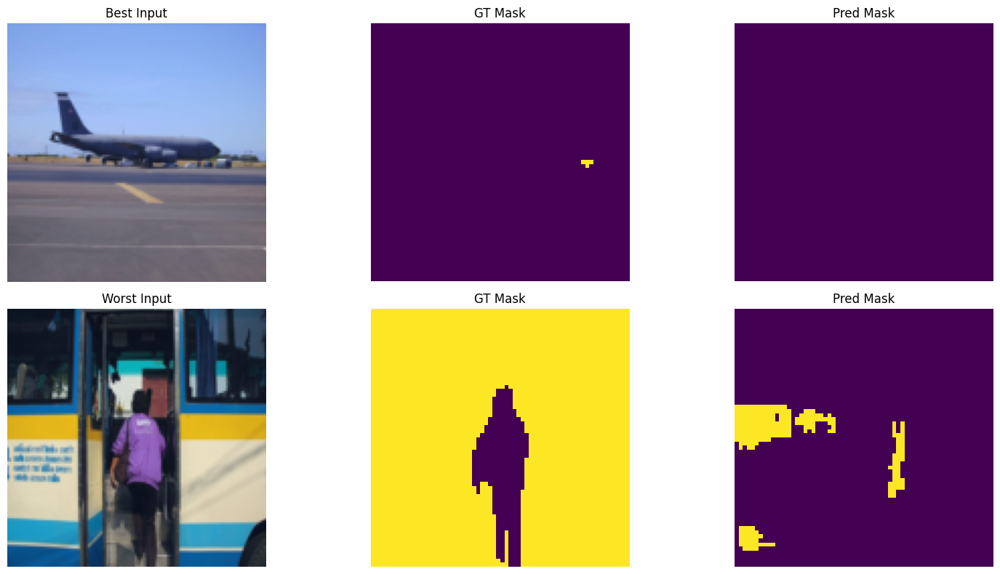


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 7: Car
Best accuracy:  0.9885
Worst accuracy: 0.3804


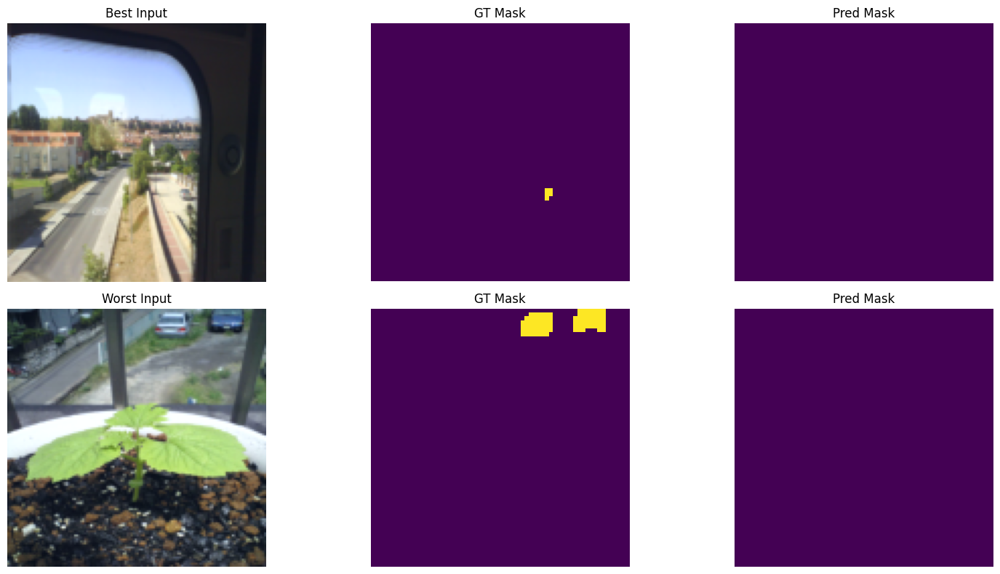


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 8: Cat
Best accuracy:  0.9729
Worst accuracy: 0.0000


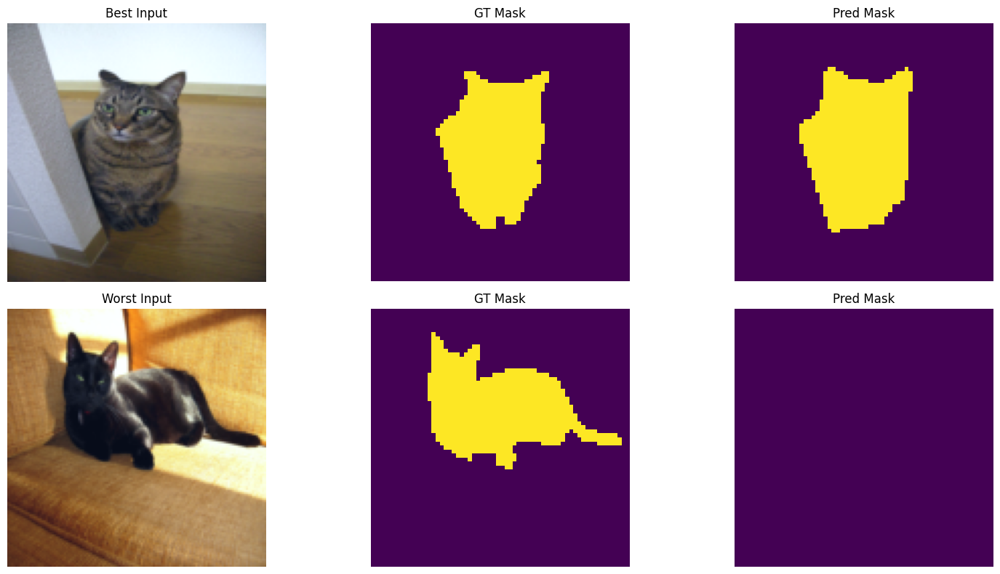


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 9: Chair
Best accuracy:  0.9663
Worst accuracy: 0.1409


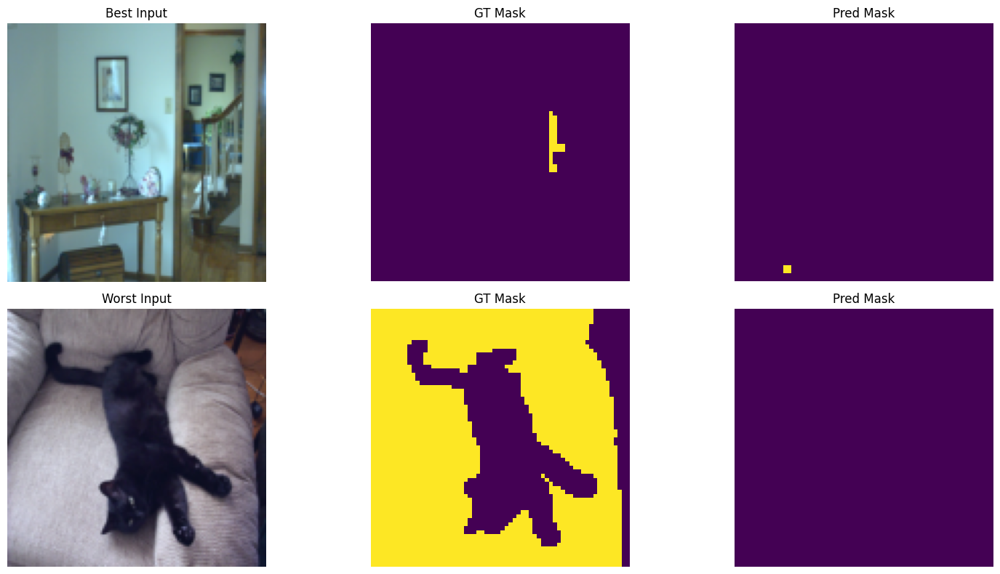


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 10: Cow
Best accuracy:  0.9814
Worst accuracy: 0.2930


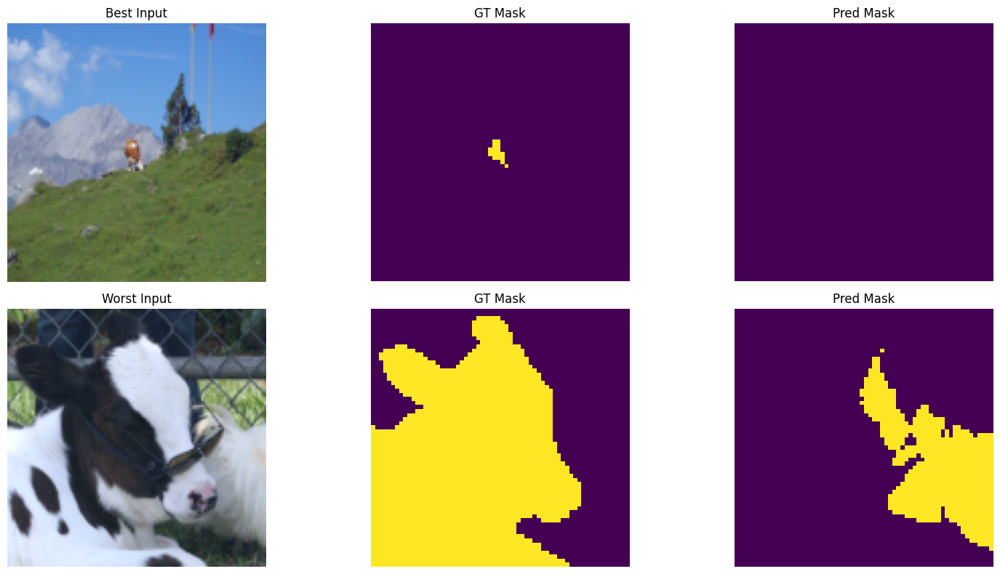


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 11: Ciningtable
Best accuracy:  0.8979
Worst accuracy: 0.0881


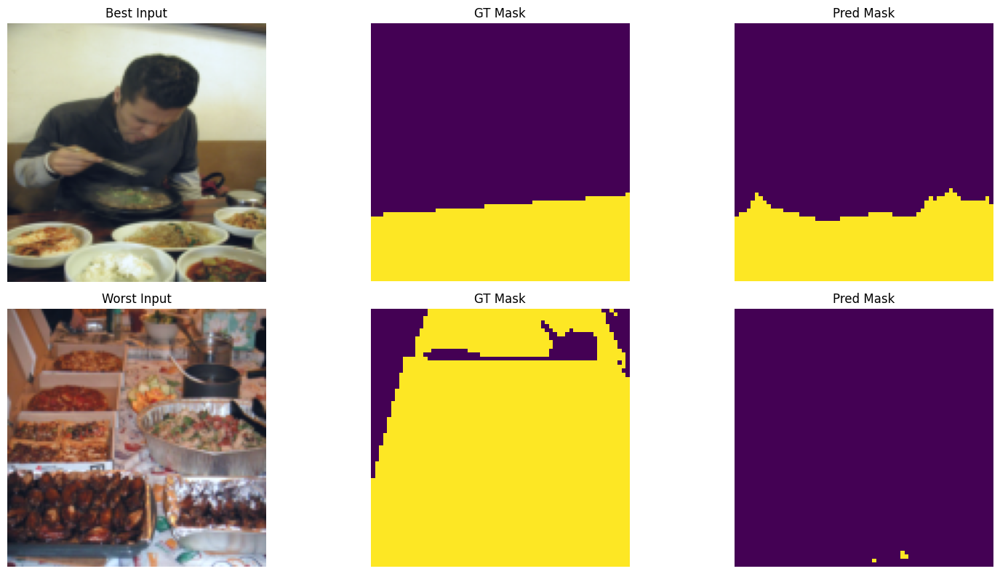


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 12: Dog
Best accuracy:  0.9829
Worst accuracy: 0.0398


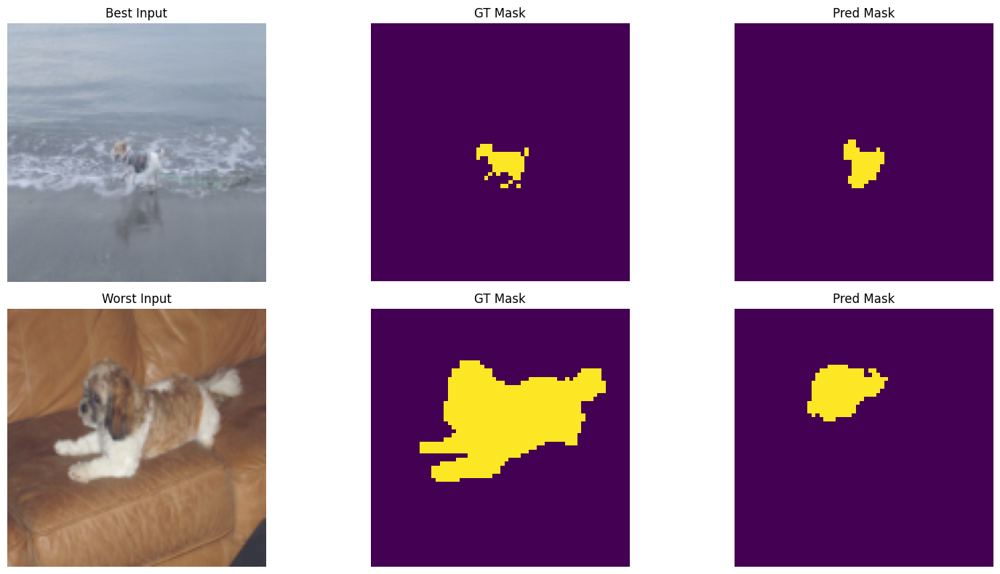


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 13: Horse
Best accuracy:  0.9944
Worst accuracy: 0.3511


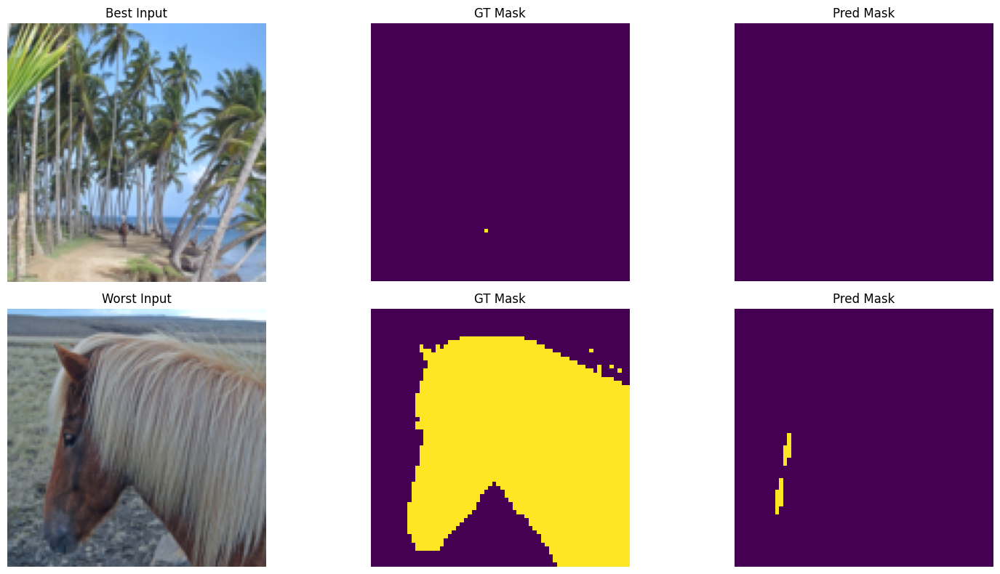


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 14: Motorbike
Best accuracy:  0.9756
Worst accuracy: 0.3860


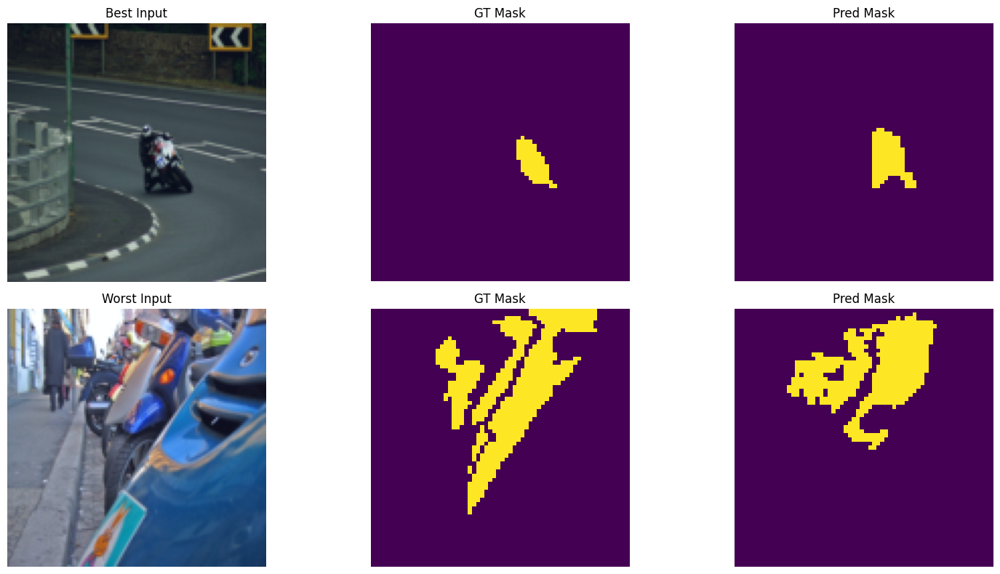


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 15: Person
Best accuracy:  0.9971
Worst accuracy: 0.1218


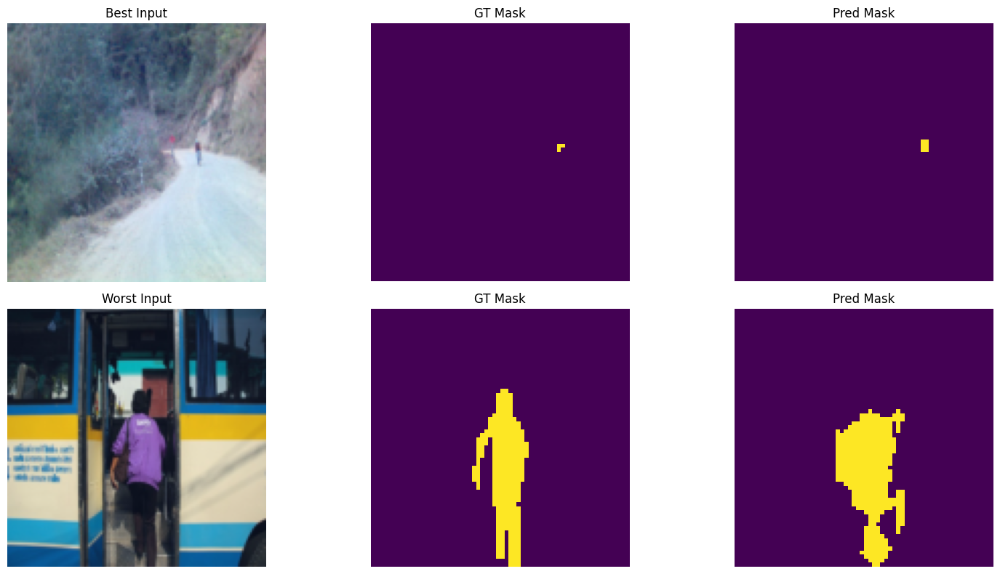


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 16: Potted Plant
Best accuracy:  0.9375
Worst accuracy: 0.3521


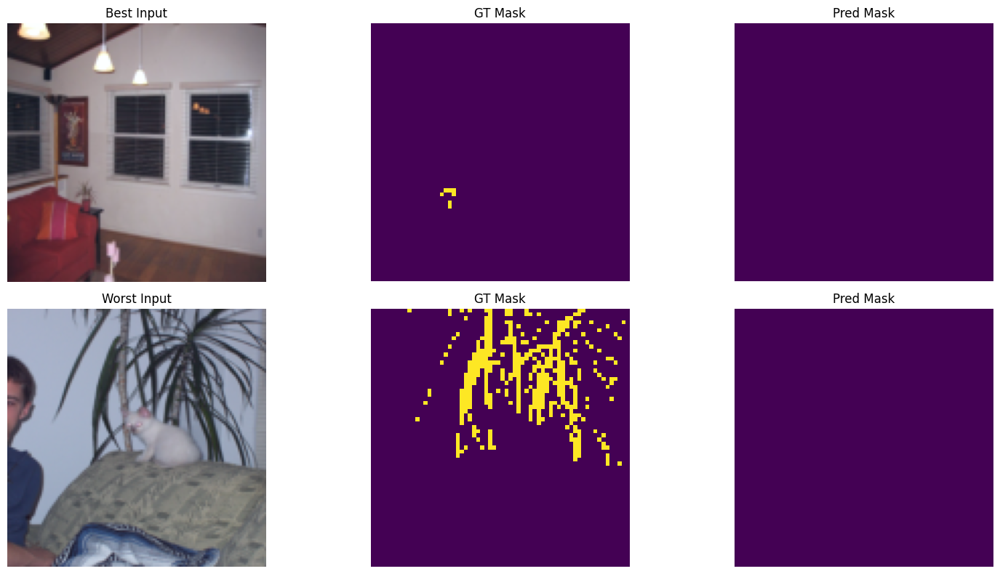


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 17: Sheep
Best accuracy:  0.9922
Worst accuracy: 0.3381


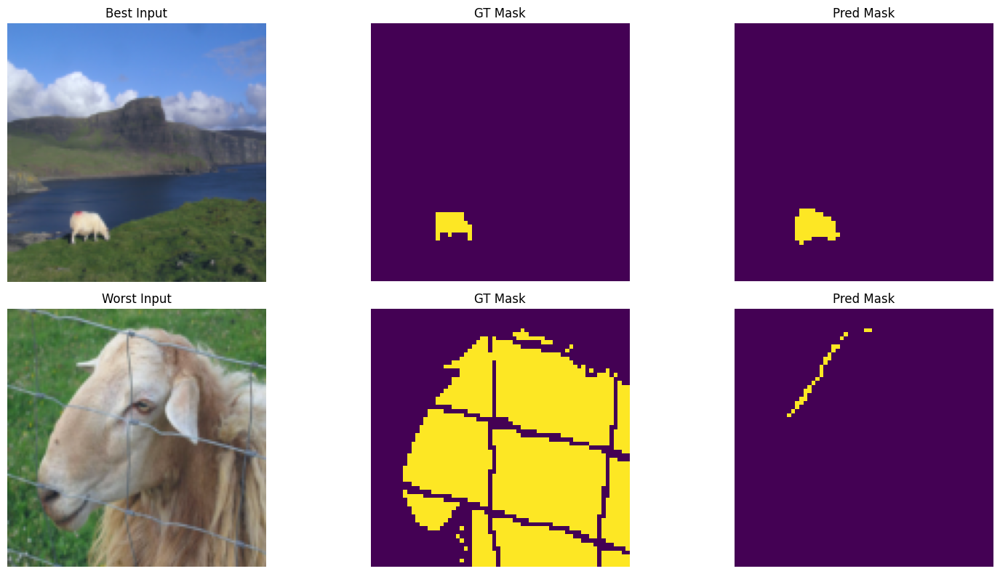


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 18: Sofa
Best accuracy:  0.9766
Worst accuracy: 0.0000


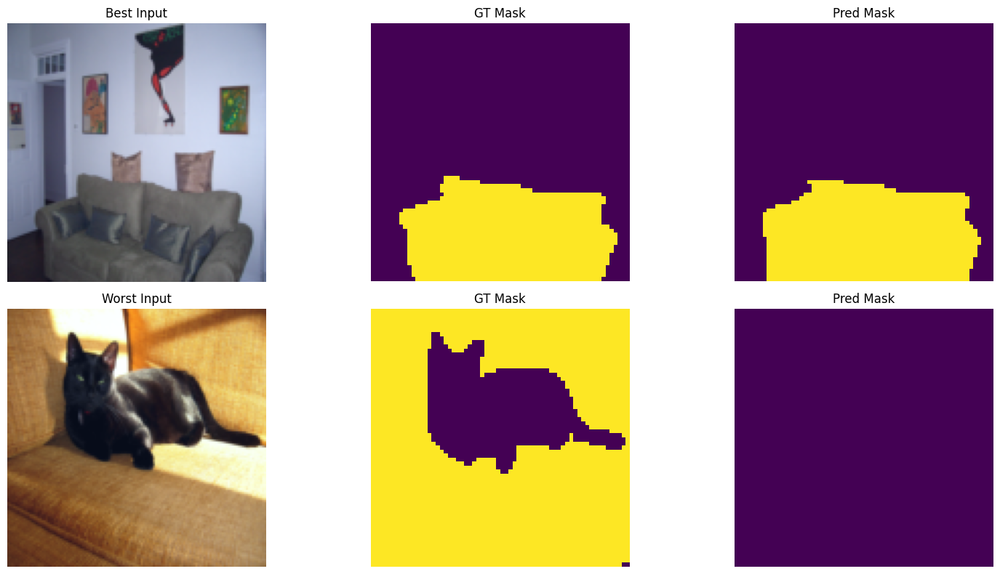


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 19: Train
Best accuracy:  0.9788
Worst accuracy: 0.1682


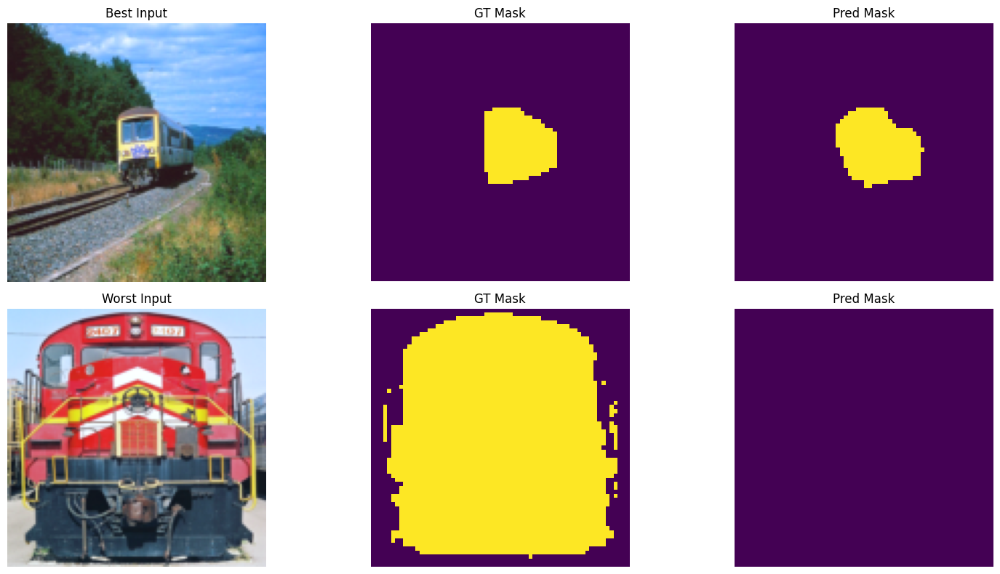


----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Class 20: Monitor
Best accuracy:  0.9688
Worst accuracy: 0.3572


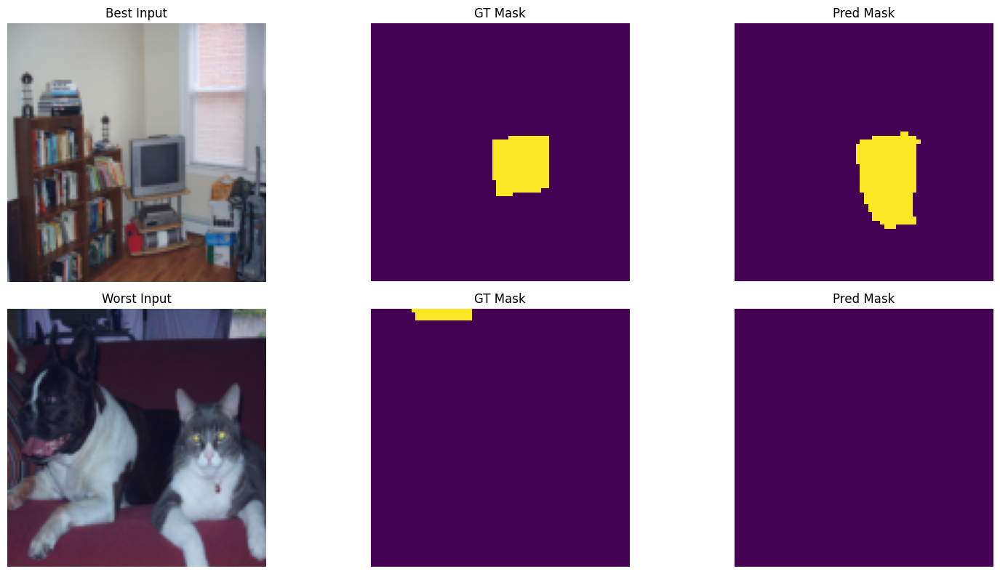

'\n1. Large objects\n    Problem:  When an object covers most of the frame, its interior looks\n             "light" (background-like), so the model under-segments the edges or\n             even carves holes in the mask.\n\n   Solutions: Boundary/contour loss - Introduce a penalty for missing or jagged boundaries\n                                     to sharpen full image masks.\n             Hard-pixel mining - During training, focus loss on ambiguous boundary\n                                 instead of vast interior “easy” pixels regions.\n\n2. Small objectes\n    Problem: Tiny objects often disappear in deep, low resolution features, especially with noisy\n             backdrop (e.g. cloudy, lots of greenery).  Since most of the pixels belong to the\n             background, the network learns to ignore small foregrounds.\n\n    Solutions: Deep monitoring at high resolution - Add auxiliary heads at the finest BiFPN scale,\n                                                   so that

In [ ]:
## TODO {
# CODE
def show_img(ax, image):
    """
    Function to display the corresponding image in the correct position.
    """
    ax.imshow(np.clip(image.permute(1,2,0).cpu().numpy()/4.5 + 0.5, 0, 1))
    ax.axis("off")


model.eval()
classes = [
    "Aeroplane", "Bicycle", "Bird", "Boat", "Bottle", "Bus", "Car",
    "Cat", "Chair", "Cow", "Ciningtable", "Dog", "Horse", "Motorbike",
    "Person", "Potted Plant", "Sheep", "Sofa", "Train", "Monitor"
]

for cls in range(1, NUM_CLASSES):
    fig, axes = plt.subplots(2, 3, figsize=(16, 8))
    print("\n" + "-" * 178)
    print(f"Class {cls}: {classes[cls-1]}")

    best_acc, worst_acc = -1.0, 1.0
    best_img = best_pred = best_mask = None
    worst_img = worst_pred = worst_mask = None

    # Analyse the entire test set
    for imgs, masks in TEST_LOADER:
        contains = (masks == cls).any(dim=(1,2))
        if not contains.any():
            continue

        imgs_sel  = imgs[contains]
        masks_sel = masks[contains]
        with torch.no_grad():
            preds = model(imgs_sel.to(DEVICE))
            preds = torch.argmax(preds, dim=1).cpu()

        # per-sample overall accuracy
        accs = (preds == masks_sel).float().mean(dim=(1,2))

        # Find the best and the worst
        top_idx = torch.argmax(accs).item()
        low_idx = torch.argmin(accs).item()

        if accs[top_idx] > best_acc:
            best_acc = accs[top_idx].item()
            best_img, best_pred, best_mask = imgs_sel[top_idx], preds[top_idx], masks_sel[top_idx]

        if accs[low_idx] < worst_acc:
            worst_acc = accs[low_idx].item()
            worst_img, worst_pred, worst_mask = imgs_sel[low_idx], preds[low_idx], masks_sel[low_idx]


    print(f"Best accuracy:  {best_acc:.4f}")
    print(f"Worst accuracy: {worst_acc:.4f}")

    axes[0,0].set_title("Best Input")
    show_img(axes[0,0], best_img)
    axes[0,1].set_title("GT Mask")
    axes[0,1].imshow((best_mask.cpu()==cls))
    axes[0,1].axis("off")
    axes[0,2].set_title("Pred Mask")
    axes[0,2].imshow((best_pred==cls))
    axes[0,2].axis("off")

    axes[1,0].set_title("Worst Input")
    show_img(axes[1,0], worst_img)
    axes[1,1].set_title("GT Mask")
    axes[1,1].imshow((worst_mask.cpu()==cls))
    axes[1,1].axis("off")
    axes[1,2].set_title("Pred Mask")
    axes[1,2].imshow((worst_pred==cls))
    axes[1,2].axis("off")

    plt.tight_layout()
    plt.show()
##}

## TODO {
# Answer
"""
1. Large objects
    Problem:  When an object covers most of the frame, its interior looks
             "light" (background-like), so the model under-segments the edges or
             even carves holes in the mask.

   Solutions: Boundary/contour loss - Introduce a penalty for missing or jagged boundaries
                                     to sharpen full image masks.
              Hard-pixel mining - During training, focus loss on ambiguous boundary
                                 instead of vast interior “easy” pixels regions.

2. Small objectes
    Problem: Tiny objects often disappear in deep, low resolution features, especially with noisy
             backdrop (e.g. cloudy, lots of greenery). Since most of the pixels belong to the
             background, the network learns to ignore small foregrounds.

    Solutions: Deep monitoring at high resolution - Add auxiliary heads at the finest BiFPN scale,
                                                   so that gradients for small objects aren't lost.

               UNet skip connections - Route early backbone features directly into the decoder to
                                     recover fine spatial detail.
               Targeted magnification - Randomly enlarge or copy/paste small objects during training
                                       so the model sees them at larger relative scales.

3. Multiple objects with one in focus:
    Problem: In cluttered scenes, the model often focuses on the largest or most significant object
             and ignores smaller, secondary instances such as obstacles that cause a pixel break
             belonging to the object.

    Solutions: Deeper BiFPN stacks - Increasing the number of BiFPN repeats so that mid-level cues
                                      for secondary objects aren’t overshadowed by the primary object.
               Attention gates in fusion -  Use CBAM or SE blocks inside BiFPN to dynamically re-weight
                                            scales where secondary objects appear.
               Apply deep supervision - Adding auxiliary heads at intermediate feature maps.

4. Observation of low contrast / low texture scenes:
    Problem: In foggy, cloudy or near monochrome conditions, local texture cues disappear,
             leading to under-segmentation or false negatives.

    Solutions: Style enhancements - Use aggressive colour jitter, random greyscale, or neural style transfer
                                    so the model learns to ignore misleading texture variations.

               Global self-attention - Insert a non-local or transformer-style block into BiFPN to
                                       emphasise shape and context over texture.

               Contrast feature learning: Add a pixels or patch-level contrastive loss that pulls
                                          together true foreground features despite low texture.

General BIFPN Improvements:
- Add squeeze-and-excitation (SE) blocks after feature fusion for better channel-wise re-weighting.
- Use learnable fusion weights (soft attention) in BiFPN instead of simple addition.
- Implement ASPP (Atrous Spatial Pyramid Pooling) for multi-scale context capturing.
- Joint loss (CrossEntropy & Dice) with appropriate weights (hyperparameters), in order to
  pushes per‐pixel class probabilities with local supervision.
- Implement variables convolutions at each fusion node so that the sampling grid
  can adapt to the shapes of objects and better capture irregular boundaries.
"""
## }


### Ablations  - 3 points

train several instances for semantic segmentation, ablate with respect to:

1. Backbone: EfficientNet and Resnet50

2. different number of BiFPN modules (num_repeats 1, 3, 5 and possibly more),

3. Training Loss CrossEntropy and Dice

Perform **8** experiments in total.

Identify the configuration achieving the highest mIoU metric for all classess simultaneously.

In [ ]:
## TODO {
# CODE
torch.manual_seed(42)

# Experiments
results = []
for backbone in ['efficientnet', 'resnet50']:
    for num_repeats in [3, 5]:
        layer_ids = [1, 3, 5] if backbone=='efficientnet' else [0, 2, 3]

        # CrossEntropy loss
        print(f"\n<=== CE: backbone={backbone}, repeats={num_repeats}, layers={layer_ids} ===>")
        model, optim = create_model_and_optimizer(num_repeats, backbone, layer_ids)
        miou_ce = train_crossentropy(model, optim, TRAIN_LOADER, TEST_LOADER, num_epoch=20, eval_fn=eval_fn)
        results.append({
            'backbone': backbone,
            'num_repeats': num_repeats,
            'loss': 'crossentropy',
            'mIoU': miou_ce
        })

        # Dice loss
        print(f"\n<=== Dice: backbone={backbone}, repeats={num_repeats}, layers={layer_ids} ===>")
        model, optim = create_model_and_optimizer(num_repeats, backbone, layer_ids)
        miou_dice = train_dice(model, optim, TRAIN_LOADER, TEST_LOADER, num_epoch=20, eval_fn=eval_fn)
        results.append({
            'backbone': backbone,
            'num_repeats': num_repeats,
            'loss': 'dice',
            'mIoU': miou_dice
        })

# Pick best by mIoU
best = max(results, key=itemgetter('mIoU'))
print("\n" + '<' + "=" * 80 + '>')
print("Best configuration:")
print(f"  Backbone   : {best['backbone']}")
print(f"  Num repeats: {best['num_repeats']}")
print(f"  Loss       : {best['loss']}")
print(f"  Mean IoU   : {best['mIoU']:.4f}")
print('<' + "=" * 80 + '>')
##}

## TODO {
# Answer
    # Best configuration in depends of test mioU is:
    # Backbone               : efficientnet
    # Num repeats            : 3
    # Loss                   : crossentropy
    # Feature Layer Ids      : 1, 3, 5
    # Best mean IoU on Test  : 0.4880
## }


<=== CE: backbone=efficientnet, repeats=3, layers=[1, 3, 5] ===>


Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


[CE] Epoch 1/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9706
Mean IoU:      0.1545
FW IoU:        0.6195
[CE] Epoch 1/20 — Train Loss: 1.0189


[CE] Epoch 2/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9709
Mean IoU:      0.1316
FW IoU:        0.5449
[CE] Epoch 2/20 — Train Loss: 0.5170


[CE] Epoch 3/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9790
Mean IoU:      0.2427
FW IoU:        0.6417
[CE] Epoch 3/20 — Train Loss: 0.4038


[CE] Epoch 4/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9798
Mean IoU:      0.1564
FW IoU:        0.6461
[CE] Epoch 4/20 — Train Loss: 0.3130


[CE] Epoch 5/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9771
Mean IoU:      0.2016
FW IoU:        0.6843
[CE] Epoch 5/20 — Train Loss: 0.2687


[CE] Epoch 6/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9757
Mean IoU:      0.1934
FW IoU:        0.6357
[CE] Epoch 6/20 — Train Loss: 0.2238


[CE] Epoch 7/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9734
Mean IoU:      0.2205
FW IoU:        0.6298
[CE] Epoch 7/20 — Train Loss: 0.2066


[CE] Epoch 8/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9736
Mean IoU:      0.2720
FW IoU:        0.5906
[CE] Epoch 8/20 — Train Loss: 0.1732


[CE] Epoch 9/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9829
Mean IoU:      0.2622
FW IoU:        0.7233
[CE] Epoch 9/20 — Train Loss: 0.1456


[CE] Epoch 10/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9822
Mean IoU:      0.3599
FW IoU:        0.7249
[CE] Epoch 10/20 — Train Loss: 0.1324


[CE] Epoch 11/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9848
Mean IoU:      0.2990
FW IoU:        0.7537
[CE] Epoch 11/20 — Train Loss: 0.1218


[CE] Epoch 12/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9770
Mean IoU:      0.3480
FW IoU:        0.6466
[CE] Epoch 12/20 — Train Loss: 0.1123


[CE] Epoch 13/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9811
Mean IoU:      0.3257
FW IoU:        0.6857
[CE] Epoch 13/20 — Train Loss: 0.1015


[CE] Epoch 14/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9865
Mean IoU:      0.2957
FW IoU:        0.7383
[CE] Epoch 14/20 — Train Loss: 0.0951


[CE] Epoch 15/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9776
Mean IoU:      0.2840
FW IoU:        0.6757
[CE] Epoch 15/20 — Train Loss: 0.0889


[CE] Epoch 16/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9785
Mean IoU:      0.3259
FW IoU:        0.6818
[CE] Epoch 16/20 — Train Loss: 0.0851


[CE] Epoch 17/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9773
Mean IoU:      0.2447
FW IoU:        0.6665
[CE] Epoch 17/20 — Train Loss: 0.0809


[CE] Epoch 18/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9885
Mean IoU:      0.4880
FW IoU:        0.7665
[CE] Epoch 18/20 — Train Loss: 0.0789


[CE] Epoch 19/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9897
Mean IoU:      0.4237
FW IoU:        0.7885
[CE] Epoch 19/20 — Train Loss: 0.0741


[CE] Epoch 20/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9834
Mean IoU:      0.3051
FW IoU:        0.7306
[CE] Epoch 20/20 — Train Loss: 0.0737
Best Val mIoU: 0.4880 at epoch 18

<=== Dice: backbone=efficientnet, repeats=3, layers=[1, 3, 5] ===>


Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


[Dice] Epoch 1/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9767
Mean IoU:      0.1288
FW IoU:        0.6346
[Dice] Epoch 1/20 — Train Loss: 0.8195


[Dice] Epoch 2/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9604
Mean IoU:      0.0630
FW IoU:        0.5317
[Dice] Epoch 2/20 — Train Loss: 0.6736


[Dice] Epoch 3/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9709
Mean IoU:      0.1180
FW IoU:        0.5872
[Dice] Epoch 3/20 — Train Loss: 0.6121


[Dice] Epoch 4/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9728
Mean IoU:      0.1321
FW IoU:        0.6077
[Dice] Epoch 4/20 — Train Loss: 0.5790


[Dice] Epoch 5/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9614
Mean IoU:      0.0937
FW IoU:        0.5237
[Dice] Epoch 5/20 — Train Loss: 0.5498


[Dice] Epoch 6/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9700
Mean IoU:      0.1239
FW IoU:        0.5741
[Dice] Epoch 6/20 — Train Loss: 0.5238


[Dice] Epoch 7/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9672
Mean IoU:      0.0901
FW IoU:        0.6497
[Dice] Epoch 7/20 — Train Loss: 0.5355


[Dice] Epoch 8/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9790
Mean IoU:      0.1882
FW IoU:        0.7011
[Dice] Epoch 8/20 — Train Loss: 0.4945


[Dice] Epoch 9/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9730
Mean IoU:      0.1540
FW IoU:        0.6101
[Dice] Epoch 9/20 — Train Loss: 0.4713


[Dice] Epoch 10/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9692
Mean IoU:      0.1325
FW IoU:        0.5740
[Dice] Epoch 10/20 — Train Loss: 0.4668


[Dice] Epoch 11/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9734
Mean IoU:      0.1653
FW IoU:        0.5660
[Dice] Epoch 11/20 — Train Loss: 0.4418


[Dice] Epoch 12/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9752
Mean IoU:      0.2538
FW IoU:        0.6512
[Dice] Epoch 12/20 — Train Loss: 0.4211


[Dice] Epoch 13/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9755
Mean IoU:      0.2011
FW IoU:        0.5509
[Dice] Epoch 13/20 — Train Loss: 0.4025


[Dice] Epoch 14/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9766
Mean IoU:      0.1929
FW IoU:        0.6699
[Dice] Epoch 14/20 — Train Loss: 0.3895


[Dice] Epoch 15/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9795
Mean IoU:      0.2606
FW IoU:        0.6524
[Dice] Epoch 15/20 — Train Loss: 0.3847


[Dice] Epoch 16/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9756
Mean IoU:      0.1791
FW IoU:        0.6631
[Dice] Epoch 16/20 — Train Loss: 0.3971


[Dice] Epoch 17/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9557
Mean IoU:      0.0883
FW IoU:        0.5261
[Dice] Epoch 17/20 — Train Loss: 0.4044


[Dice] Epoch 18/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9657
Mean IoU:      0.1773
FW IoU:        0.5313
[Dice] Epoch 18/20 — Train Loss: 0.4238


[Dice] Epoch 19/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9729
Mean IoU:      0.1604
FW IoU:        0.6251
[Dice] Epoch 19/20 — Train Loss: 0.4127


[Dice] Epoch 20/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9740
Mean IoU:      0.1438
FW IoU:        0.6067
[Dice] Epoch 20/20 — Train Loss: 0.4169
Best Val mIoU: 0.2606 at epoch 15

<=== CE: backbone=efficientnet, repeats=5, layers=[1, 3, 5] ===>


Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


[CE] Epoch 1/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9649
Mean IoU:      0.1477
FW IoU:        0.4774
[CE] Epoch 1/20 — Train Loss: 0.9877


[CE] Epoch 2/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9742
Mean IoU:      0.0853
FW IoU:        0.5973
[CE] Epoch 2/20 — Train Loss: 0.5169


[CE] Epoch 3/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9726
Mean IoU:      0.1628
FW IoU:        0.5417
[CE] Epoch 3/20 — Train Loss: 0.3943


[CE] Epoch 4/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9771
Mean IoU:      0.2078
FW IoU:        0.6446
[CE] Epoch 4/20 — Train Loss: 0.3046


[CE] Epoch 5/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9697
Mean IoU:      0.1717
FW IoU:        0.6071
[CE] Epoch 5/20 — Train Loss: 0.2610


[CE] Epoch 6/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9780
Mean IoU:      0.2533
FW IoU:        0.6473
[CE] Epoch 6/20 — Train Loss: 0.2389


[CE] Epoch 7/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9777
Mean IoU:      0.1893
FW IoU:        0.6057
[CE] Epoch 7/20 — Train Loss: 0.2181


[CE] Epoch 8/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9782
Mean IoU:      0.2438
FW IoU:        0.6243
[CE] Epoch 8/20 — Train Loss: 0.1859


[CE] Epoch 9/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9779
Mean IoU:      0.2576
FW IoU:        0.6377
[CE] Epoch 9/20 — Train Loss: 0.1604


[CE] Epoch 10/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9665
Mean IoU:      0.1860
FW IoU:        0.6242
[CE] Epoch 10/20 — Train Loss: 0.1443


[CE] Epoch 11/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9778
Mean IoU:      0.2633
FW IoU:        0.6309
[CE] Epoch 11/20 — Train Loss: 0.1351


[CE] Epoch 12/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9860
Mean IoU:      0.3053
FW IoU:        0.7393
[CE] Epoch 12/20 — Train Loss: 0.1269


[CE] Epoch 13/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9800
Mean IoU:      0.2142
FW IoU:        0.6062
[CE] Epoch 13/20 — Train Loss: 0.1107


[CE] Epoch 14/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9796
Mean IoU:      0.2236
FW IoU:        0.6925
[CE] Epoch 14/20 — Train Loss: 0.0990


[CE] Epoch 15/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9816
Mean IoU:      0.2637
FW IoU:        0.7132
[CE] Epoch 15/20 — Train Loss: 0.0909


[CE] Epoch 16/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9872
Mean IoU:      0.3701
FW IoU:        0.7778
[CE] Epoch 16/20 — Train Loss: 0.0841


[CE] Epoch 17/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9808
Mean IoU:      0.3236
FW IoU:        0.6819
[CE] Epoch 17/20 — Train Loss: 0.0767


[CE] Epoch 18/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9783
Mean IoU:      0.2644
FW IoU:        0.6715
[CE] Epoch 18/20 — Train Loss: 0.0755


[CE] Epoch 19/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9797
Mean IoU:      0.2865
FW IoU:        0.7107
[CE] Epoch 19/20 — Train Loss: 0.0719


[CE] Epoch 20/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9816
Mean IoU:      0.2831
FW IoU:        0.6863
[CE] Epoch 20/20 — Train Loss: 0.0701
Best Val mIoU: 0.3701 at epoch 16

<=== Dice: backbone=efficientnet, repeats=5, layers=[1, 3, 5] ===>


Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


[Dice] Epoch 1/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9649
Mean IoU:      0.1161
FW IoU:        0.5383
[Dice] Epoch 1/20 — Train Loss: 0.8059


[Dice] Epoch 2/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9742
Mean IoU:      0.1103
FW IoU:        0.6148
[Dice] Epoch 2/20 — Train Loss: 0.6879


[Dice] Epoch 3/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9712
Mean IoU:      0.1615
FW IoU:        0.5651
[Dice] Epoch 3/20 — Train Loss: 0.6347


[Dice] Epoch 4/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9754
Mean IoU:      0.0982
FW IoU:        0.6360
[Dice] Epoch 4/20 — Train Loss: 0.5904


[Dice] Epoch 5/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9708
Mean IoU:      0.1396
FW IoU:        0.5738
[Dice] Epoch 5/20 — Train Loss: 0.5546


[Dice] Epoch 6/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9697
Mean IoU:      0.1024
FW IoU:        0.6429
[Dice] Epoch 6/20 — Train Loss: 0.5345


[Dice] Epoch 7/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9693
Mean IoU:      0.1113
FW IoU:        0.6111
[Dice] Epoch 7/20 — Train Loss: 0.5321


[Dice] Epoch 8/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9751
Mean IoU:      0.1521
FW IoU:        0.5931
[Dice] Epoch 8/20 — Train Loss: 0.5157


[Dice] Epoch 9/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9743
Mean IoU:      0.1696
FW IoU:        0.6068
[Dice] Epoch 9/20 — Train Loss: 0.4595


[Dice] Epoch 10/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9747
Mean IoU:      0.1412
FW IoU:        0.6124
[Dice] Epoch 10/20 — Train Loss: 0.4470


[Dice] Epoch 11/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9729
Mean IoU:      0.2033
FW IoU:        0.5958
[Dice] Epoch 11/20 — Train Loss: 0.4501


[Dice] Epoch 12/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9818
Mean IoU:      0.2092
FW IoU:        0.6864
[Dice] Epoch 12/20 — Train Loss: 0.4239


[Dice] Epoch 13/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9748
Mean IoU:      0.1942
FW IoU:        0.6159
[Dice] Epoch 13/20 — Train Loss: 0.4305


[Dice] Epoch 14/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9502
Mean IoU:      0.1180
FW IoU:        0.4527
[Dice] Epoch 14/20 — Train Loss: 0.4467


[Dice] Epoch 15/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9642
Mean IoU:      0.1526
FW IoU:        0.5434
[Dice] Epoch 15/20 — Train Loss: 0.4144


[Dice] Epoch 16/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9784
Mean IoU:      0.2286
FW IoU:        0.6775
[Dice] Epoch 16/20 — Train Loss: 0.4000


[Dice] Epoch 17/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9820
Mean IoU:      0.1666
FW IoU:        0.7241
[Dice] Epoch 17/20 — Train Loss: 0.3941


[Dice] Epoch 18/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9647
Mean IoU:      0.2147
FW IoU:        0.5655
[Dice] Epoch 18/20 — Train Loss: 0.3653


[Dice] Epoch 19/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9683
Mean IoU:      0.1571
FW IoU:        0.5524
[Dice] Epoch 19/20 — Train Loss: 0.3930


[Dice] Epoch 20/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9674
Mean IoU:      0.2032
FW IoU:        0.5135
[Dice] Epoch 20/20 — Train Loss: 0.3687
Best Val mIoU: 0.2286 at epoch 16

<=== CE: backbone=resnet50, repeats=3, layers=[0, 2, 3] ===>


Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


[CE] Epoch 1/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9617
Mean IoU:      0.0682
FW IoU:        0.5013
[CE] Epoch 1/20 — Train Loss: 1.1501


[CE] Epoch 2/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9672
Mean IoU:      0.1021
FW IoU:        0.5497
[CE] Epoch 2/20 — Train Loss: 0.8180


[CE] Epoch 3/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9603
Mean IoU:      0.0496
FW IoU:        0.5318
[CE] Epoch 3/20 — Train Loss: 0.7014


[CE] Epoch 4/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9668
Mean IoU:      0.1087
FW IoU:        0.5367
[CE] Epoch 4/20 — Train Loss: 0.6317


[CE] Epoch 5/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9709
Mean IoU:      0.1349
FW IoU:        0.6118
[CE] Epoch 5/20 — Train Loss: 0.5157


[CE] Epoch 6/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9696
Mean IoU:      0.1315
FW IoU:        0.5433
[CE] Epoch 6/20 — Train Loss: 0.4640


[CE] Epoch 7/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9704
Mean IoU:      0.1460
FW IoU:        0.6097
[CE] Epoch 7/20 — Train Loss: 0.4242


[CE] Epoch 8/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9659
Mean IoU:      0.1643
FW IoU:        0.5508
[CE] Epoch 8/20 — Train Loss: 0.4098


[CE] Epoch 9/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9766
Mean IoU:      0.2306
FW IoU:        0.6350
[CE] Epoch 9/20 — Train Loss: 0.3631


[CE] Epoch 10/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9715
Mean IoU:      0.2101
FW IoU:        0.5860
[CE] Epoch 10/20 — Train Loss: 0.3057


[CE] Epoch 11/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9755
Mean IoU:      0.1953
FW IoU:        0.6070
[CE] Epoch 11/20 — Train Loss: 0.2210


[CE] Epoch 12/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9712
Mean IoU:      0.1733
FW IoU:        0.5444
[CE] Epoch 12/20 — Train Loss: 0.1968


[CE] Epoch 13/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9765
Mean IoU:      0.1432
FW IoU:        0.6530
[CE] Epoch 13/20 — Train Loss: 0.1608


[CE] Epoch 14/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9807
Mean IoU:      0.2685
FW IoU:        0.6690
[CE] Epoch 14/20 — Train Loss: 0.1345


[CE] Epoch 15/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9743
Mean IoU:      0.2465
FW IoU:        0.6209
[CE] Epoch 15/20 — Train Loss: 0.1092


[CE] Epoch 16/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9797
Mean IoU:      0.2636
FW IoU:        0.6730
[CE] Epoch 16/20 — Train Loss: 0.1040


[CE] Epoch 17/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9767
Mean IoU:      0.2077
FW IoU:        0.6635
[CE] Epoch 17/20 — Train Loss: 0.0926


[CE] Epoch 18/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9715
Mean IoU:      0.1845
FW IoU:        0.5534
[CE] Epoch 18/20 — Train Loss: 0.0797


[CE] Epoch 19/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9716
Mean IoU:      0.3062
FW IoU:        0.5664
[CE] Epoch 19/20 — Train Loss: 0.0757


[CE] Epoch 20/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9745
Mean IoU:      0.1435
FW IoU:        0.6628
[CE] Epoch 20/20 — Train Loss: 0.0698
Best Val mIoU: 0.3062 at epoch 19

<=== Dice: backbone=resnet50, repeats=3, layers=[0, 2, 3] ===>


Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


[Dice] Epoch 1/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9624
Mean IoU:      0.0306
FW IoU:        0.4212
[Dice] Epoch 1/20 — Train Loss: 0.8951


[Dice] Epoch 2/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9380
Mean IoU:      0.0312
FW IoU:        0.4022
[Dice] Epoch 2/20 — Train Loss: 0.8560


[Dice] Epoch 3/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9322
Mean IoU:      0.0372
FW IoU:        0.3156
[Dice] Epoch 3/20 — Train Loss: 0.8578


[Dice] Epoch 4/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9554
Mean IoU:      0.0560
FW IoU:        0.5333
[Dice] Epoch 4/20 — Train Loss: 0.8491


[Dice] Epoch 5/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9345
Mean IoU:      0.0528
FW IoU:        0.3728
[Dice] Epoch 5/20 — Train Loss: 0.8236


[Dice] Epoch 6/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9575
Mean IoU:      0.0480
FW IoU:        0.3957
[Dice] Epoch 6/20 — Train Loss: 0.7976


[Dice] Epoch 7/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9602
Mean IoU:      0.0922
FW IoU:        0.5475
[Dice] Epoch 7/20 — Train Loss: 0.7800


[Dice] Epoch 8/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9509
Mean IoU:      0.1237
FW IoU:        0.4698
[Dice] Epoch 8/20 — Train Loss: 0.7596


[Dice] Epoch 9/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9607
Mean IoU:      0.0843
FW IoU:        0.4810
[Dice] Epoch 9/20 — Train Loss: 0.7388


[Dice] Epoch 10/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9605
Mean IoU:      0.1171
FW IoU:        0.5510
[Dice] Epoch 10/20 — Train Loss: 0.7590


[Dice] Epoch 11/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9571
Mean IoU:      0.0757
FW IoU:        0.5133
[Dice] Epoch 11/20 — Train Loss: 0.7437


[Dice] Epoch 12/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9682
Mean IoU:      0.1004
FW IoU:        0.5781
[Dice] Epoch 12/20 — Train Loss: 0.7316


[Dice] Epoch 13/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9460
Mean IoU:      0.0804
FW IoU:        0.4706
[Dice] Epoch 13/20 — Train Loss: 0.7163


[Dice] Epoch 14/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9623
Mean IoU:      0.0857
FW IoU:        0.5461
[Dice] Epoch 14/20 — Train Loss: 0.7130


[Dice] Epoch 15/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9698
Mean IoU:      0.0931
FW IoU:        0.5491
[Dice] Epoch 15/20 — Train Loss: 0.7047


[Dice] Epoch 16/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9667
Mean IoU:      0.0706
FW IoU:        0.5820
[Dice] Epoch 16/20 — Train Loss: 0.6723


[Dice] Epoch 17/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9589
Mean IoU:      0.0915
FW IoU:        0.4677
[Dice] Epoch 17/20 — Train Loss: 0.6436


[Dice] Epoch 18/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9701
Mean IoU:      0.1381
FW IoU:        0.6516
[Dice] Epoch 18/20 — Train Loss: 0.6312


[Dice] Epoch 19/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9632
Mean IoU:      0.1384
FW IoU:        0.5660
[Dice] Epoch 19/20 — Train Loss: 0.6116


[Dice] Epoch 20/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9608
Mean IoU:      0.1329
FW IoU:        0.5144
[Dice] Epoch 20/20 — Train Loss: 0.6077
Best Val mIoU: 0.1384 at epoch 19

<=== CE: backbone=resnet50, repeats=5, layers=[0, 2, 3] ===>


Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


[CE] Epoch 1/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9397
Mean IoU:      0.0382
FW IoU:        0.4438
[CE] Epoch 1/20 — Train Loss: 1.1833


[CE] Epoch 2/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9635
Mean IoU:      0.1305
FW IoU:        0.4679
[CE] Epoch 2/20 — Train Loss: 0.8256


[CE] Epoch 3/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9685
Mean IoU:      0.1270
FW IoU:        0.5135
[CE] Epoch 3/20 — Train Loss: 0.6609


[CE] Epoch 4/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9761
Mean IoU:      0.1157
FW IoU:        0.6021
[CE] Epoch 4/20 — Train Loss: 0.5944


[CE] Epoch 5/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9761
Mean IoU:      0.1230
FW IoU:        0.6337
[CE] Epoch 5/20 — Train Loss: 0.5396


[CE] Epoch 6/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9720
Mean IoU:      0.1019
FW IoU:        0.6539
[CE] Epoch 6/20 — Train Loss: 0.4745


[CE] Epoch 7/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9793
Mean IoU:      0.1106
FW IoU:        0.6637
[CE] Epoch 7/20 — Train Loss: 0.4024


[CE] Epoch 8/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9673
Mean IoU:      0.1549
FW IoU:        0.5869
[CE] Epoch 8/20 — Train Loss: 0.3167


[CE] Epoch 9/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9685
Mean IoU:      0.2086
FW IoU:        0.6341
[CE] Epoch 9/20 — Train Loss: 0.2562


[CE] Epoch 10/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9733
Mean IoU:      0.1764
FW IoU:        0.6297
[CE] Epoch 10/20 — Train Loss: 0.2177


[CE] Epoch 11/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9735
Mean IoU:      0.2018
FW IoU:        0.6705
[CE] Epoch 11/20 — Train Loss: 0.2044


[CE] Epoch 12/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9745
Mean IoU:      0.1810
FW IoU:        0.6219
[CE] Epoch 12/20 — Train Loss: 0.2109


[CE] Epoch 13/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9710
Mean IoU:      0.1615
FW IoU:        0.6093
[CE] Epoch 13/20 — Train Loss: 0.2031


[CE] Epoch 14/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9711
Mean IoU:      0.1343
FW IoU:        0.6275
[CE] Epoch 14/20 — Train Loss: 0.1579


[CE] Epoch 15/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9732
Mean IoU:      0.1675
FW IoU:        0.6375
[CE] Epoch 15/20 — Train Loss: 0.1336


[CE] Epoch 16/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9689
Mean IoU:      0.1636
FW IoU:        0.5804
[CE] Epoch 16/20 — Train Loss: 0.1330


[CE] Epoch 17/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9712
Mean IoU:      0.1149
FW IoU:        0.6047
[CE] Epoch 17/20 — Train Loss: 0.1518


[CE] Epoch 18/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9688
Mean IoU:      0.1626
FW IoU:        0.5686
[CE] Epoch 18/20 — Train Loss: 0.2552


[CE] Epoch 19/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9675
Mean IoU:      0.0768
FW IoU:        0.5290
[CE] Epoch 19/20 — Train Loss: 0.2834


[CE] Epoch 20/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9686
Mean IoU:      0.1510
FW IoU:        0.5657
[CE] Epoch 20/20 — Train Loss: 0.2705
Best Val mIoU: 0.2086 at epoch 9

<=== Dice: backbone=resnet50, repeats=5, layers=[0, 2, 3] ===>


Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


[Dice] Epoch 1/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9352
Mean IoU:      0.0375
FW IoU:        0.3684
[Dice] Epoch 1/20 — Train Loss: 0.8804


[Dice] Epoch 2/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9304
Mean IoU:      0.0255
FW IoU:        0.1885
[Dice] Epoch 2/20 — Train Loss: 0.8401


[Dice] Epoch 3/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9592
Mean IoU:      0.0665
FW IoU:        0.4797
[Dice] Epoch 3/20 — Train Loss: 0.8384


[Dice] Epoch 4/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9189
Mean IoU:      0.0457
FW IoU:        0.3088
[Dice] Epoch 4/20 — Train Loss: 0.8062


[Dice] Epoch 5/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9513
Mean IoU:      0.0792
FW IoU:        0.3794
[Dice] Epoch 5/20 — Train Loss: 0.8134


[Dice] Epoch 6/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9575
Mean IoU:      0.1298
FW IoU:        0.5154
[Dice] Epoch 6/20 — Train Loss: 0.7900


[Dice] Epoch 7/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9535
Mean IoU:      0.0595
FW IoU:        0.4305
[Dice] Epoch 7/20 — Train Loss: 0.7876


[Dice] Epoch 8/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9641
Mean IoU:      0.1439
FW IoU:        0.5210
[Dice] Epoch 8/20 — Train Loss: 0.7501


[Dice] Epoch 9/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9604
Mean IoU:      0.0906
FW IoU:        0.5169
[Dice] Epoch 9/20 — Train Loss: 0.7748


[Dice] Epoch 10/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9677
Mean IoU:      0.0826
FW IoU:        0.5686
[Dice] Epoch 10/20 — Train Loss: 0.7606


[Dice] Epoch 11/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9640
Mean IoU:      0.1177
FW IoU:        0.5465
[Dice] Epoch 11/20 — Train Loss: 0.7332


[Dice] Epoch 12/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9630
Mean IoU:      0.0891
FW IoU:        0.5720
[Dice] Epoch 12/20 — Train Loss: 0.7126


[Dice] Epoch 13/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9729
Mean IoU:      0.1743
FW IoU:        0.6411
[Dice] Epoch 13/20 — Train Loss: 0.6900


[Dice] Epoch 14/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9663
Mean IoU:      0.1108
FW IoU:        0.5707
[Dice] Epoch 14/20 — Train Loss: 0.6632


[Dice] Epoch 15/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9613
Mean IoU:      0.1051
FW IoU:        0.5244
[Dice] Epoch 15/20 — Train Loss: 0.6524


[Dice] Epoch 16/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9622
Mean IoU:      0.1291
FW IoU:        0.5189
[Dice] Epoch 16/20 — Train Loss: 0.6586


[Dice] Epoch 17/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9598
Mean IoU:      0.1731
FW IoU:        0.5196
[Dice] Epoch 17/20 — Train Loss: 0.6566


[Dice] Epoch 18/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9569
Mean IoU:      0.1122
FW IoU:        0.5008
[Dice] Epoch 18/20 — Train Loss: 0.6366


[Dice] Epoch 19/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9680
Mean IoU:      0.1029
FW IoU:        0.5757
[Dice] Epoch 19/20 — Train Loss: 0.6365


[Dice] Epoch 20/20:   0%|          | 0/35 [00:00<?, ?it/s]

Mean Accuracy: 0.9657
Mean IoU:      0.1128
FW IoU:        0.5562
[Dice] Epoch 20/20 — Train Loss: 0.6588
Best Val mIoU: 0.1743 at epoch 13

<================================================================================>
Best configuration:
  Backbone   : efficientnet
  Num repeats: 3
  Loss       : crossentropy
  Mean IoU   : 0.4880
<================================================================================>
